# AFL Stampede Detection

YOLO26 + BoT-SORT + Crowd Motion Analysis

## 1. Environment and GPU

In [1]:
import torch
print("PyTorch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())
print("GPU:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU")

PyTorch: 2.12.0+cu130
CUDA available: True
GPU: NVIDIA GeForce RTX 4070 Laptop GPU


## 2. Imports

In [2]:
from ultralytics import YOLO
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

## 3. Project Paths

In [3]:
PROJECT_ROOT = Path("..")
DATA_DIR = PROJECT_ROOT / "data" / "input"
MODEL_PATH = PROJECT_ROOT / "yolo26n.pt"

print("Data directory:", DATA_DIR)
print("Model:", MODEL_PATH)

Data directory: ../data/input
Model: ../yolo26n.pt


## 4. AFL Videos

In [4]:
videos = sorted(DATA_DIR.glob("*.mp4"))
for video in videos:
    print(video.name)

dense_closeup.mp4
low_res.mp4
side.mp4
sparse.mp4
top_distant.mp4


## 5. Load YOLO26

In [5]:
model = YOLO(str(MODEL_PATH))
print("YOLO26 loaded successfully")

YOLO26 loaded successfully


In [6]:
# Select an AFL video
video_path = DATA_DIR / "dense_closeup.mp4"

print("Video:", video_path)
print("Exists:", video_path.exists())


Video: ../data/input/dense_closeup.mp4
Exists: True


In [7]:
# Inspect video properties

cap = cv2.VideoCapture(str(video_path))

fps = cap.get(cv2.CAP_PROP_FPS)
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

duration = frame_count / fps if fps else 0

cap.release()

print(f"Resolution : {width} x {height}")
print(f"FPS        : {fps:.2f}")
print(f"Frames     : {frame_count}")
print(f"Duration   : {duration:.2f} seconds")

Resolution : 768 x 432
FPS        : 23.98
Frames     : 611
Duration   : 25.48 seconds


In [8]:
# YOLO26 person detection on AFL crowd video

results = model.predict(
    source=str(video_path),
    device=0,
    classes=[0],      # COCO class 0 = person
    conf=0.25,
    verbose=True
)

print(f"Processed {len(results)} frames")


WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/611) /home/sathvik/6.3C - LSTM for Language Modeling/redback/redback-orion/Crowd_Monitoring/Stampede_Detection/notebooks/../data/input/dense_closeup.mp4: 384x640 (no detections), 8.0ms
video 1/1 (frame 2/611) /home/sathvik/6.3C - LSTM for Language Modeling/redback/redback-orion/Crowd_Monitoring/Stampede_Detection/notebooks/../data/input/dense_closeup.mp4: 384x640 (no detections), 10.0ms
video 1/1 (frame 3/611) /home/sathvik/6.3C - LSTM

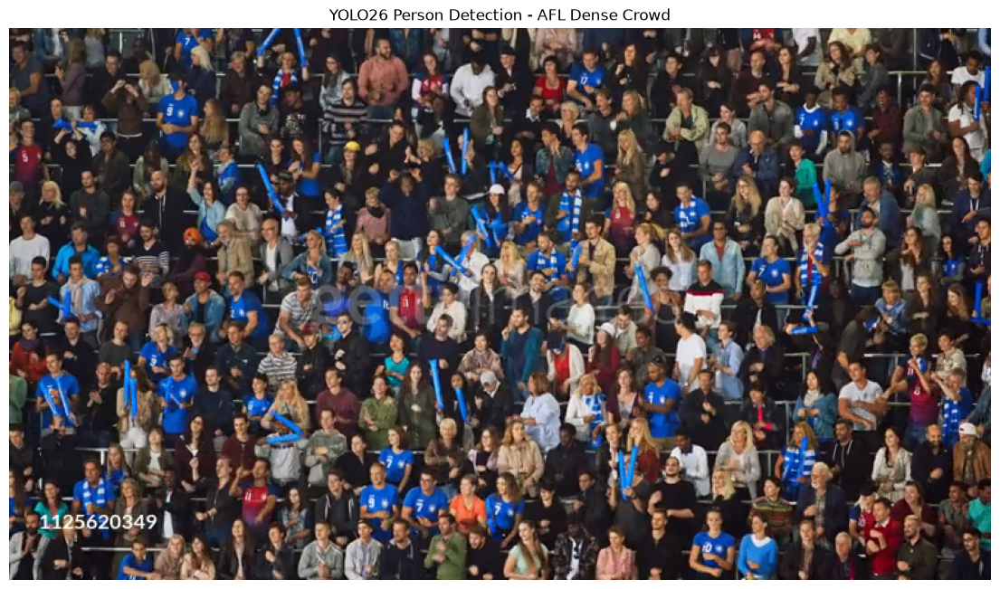

In [9]:
# Display a sample detection result

sample_result = results[len(results) // 2]

annotated_frame = sample_result.plot()

plt.figure(figsize=(14, 8))
plt.imshow(cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title("YOLO26 Person Detection - AFL Dense Crowd")
plt.show()

Frame shape: (432, 768, 3)



0: 736x1280 22 persons, 61.8ms
Speed: 4.0ms preprocess, 61.8ms inference, 0.6ms postprocess per image at shape (1, 3, 736, 1280)
Persons detected: 22


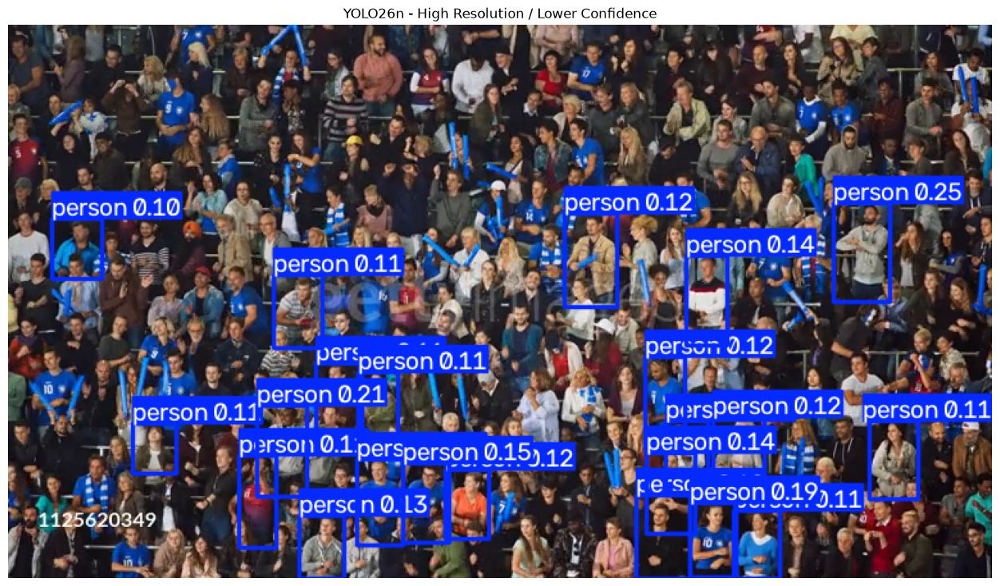

In [10]:
# Test YOLO26 at higher resolution and lower confidence
# We use a single frame first so we can compare quickly.

cap = cv2.VideoCapture(str(video_path))

# Move to the middle of the video
cap.set(cv2.CAP_PROP_POS_FRAMES, 300)

ret, frame = cap.read()
cap.release()

if not ret:
    raise RuntimeError("Could not read the video frame.")

print("Frame shape:", frame.shape)

test_result = model.predict(
    source=frame,
    device=0,
    classes=[0],
    conf=0.10,
    imgsz=1280,
    verbose=True
)[0]

print("Persons detected:", len(test_result.boxes))

annotated = test_result.plot()

plt.figure(figsize=(16, 9))
plt.imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title("YOLO26n - High Resolution / Lower Confidence")
plt.show()

In [11]:
# YOLO26 parameter comparison on the same AFL frame

configs = [
    {"imgsz": 640,  "conf": 0.25},
    {"imgsz": 1280, "conf": 0.25},
    {"imgsz": 1280, "conf": 0.15},
    {"imgsz": 1280, "conf": 0.10},
]

comparison = []

for cfg in configs:
    result = model.predict(
        source=frame,
        device=0,
        classes=[0],
        imgsz=cfg["imgsz"],
        conf=cfg["conf"],
        verbose=False
    )[0]

    comparison.append({
        "Image Size": cfg["imgsz"],
        "Confidence": cfg["conf"],
        "Persons Detected": len(result.boxes)
    })

comparison_df = pd.DataFrame(comparison)

comparison_df

,Image Size,Confidence,Persons Detected
0,640,0.25,0
1,1280,0.25,0
2,1280,0.15,3
3,1280,0.10,22


## YOLO26 Baseline Evaluation

The standard YOLO26n COCO model was evaluated on an AFL dense-crowd frame using different input resolutions and confidence thresholds.

Increasing the input resolution from 640 to 1280 improved the ability to identify small people, while reducing the confidence threshold from 0.25 to 0.10 substantially increased detections.

However, even at 1280 resolution and a confidence threshold of 0.10, only 22 people were detected in a highly populated stadium scene. This indicates that the standard COCO-trained YOLO26n model has insufficient recall for heavily occluded, dense crowds.

Therefore, the model is retained as a baseline rather than being used directly for crowd tracking.

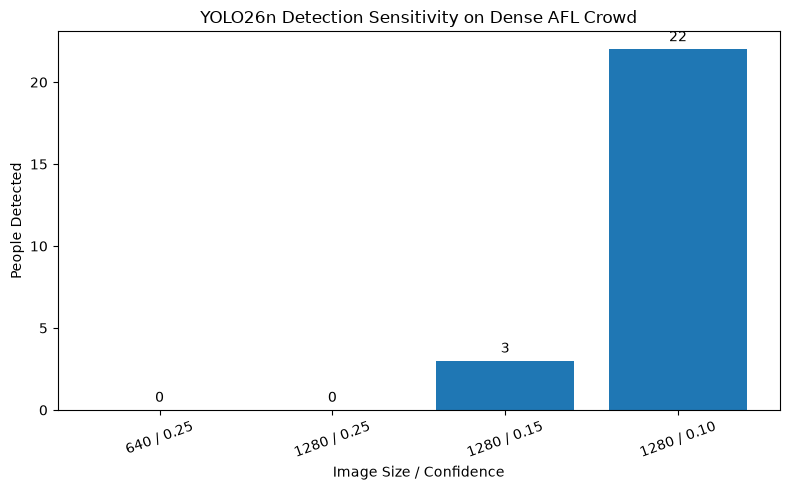

In [12]:
# Visualize the YOLO26 baseline comparison

plt.figure(figsize=(8, 5))

labels = [
    "640 / 0.25",
    "1280 / 0.25",
    "1280 / 0.15",
    "1280 / 0.10"
]

detections = comparison_df["Persons Detected"]

bars = plt.bar(labels, detections)

plt.xlabel("Image Size / Confidence")
plt.ylabel("People Detected")
plt.title("YOLO26n Detection Sensitivity on Dense AFL Crowd")
plt.xticks(rotation=20)

for bar, value in zip(bars, detections):
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        value + 0.5,
        str(value),
        ha="center"
    )

plt.tight_layout()
plt.show()

### Baseline Finding

The standard YOLO26n COCO model performs poorly on the dense AFL crowd footage. Increasing the input resolution from 640 to 1280 alone did not improve detections at a confidence threshold of 0.25. Reducing the threshold to 0.15 produced only 3 detections, while 0.10 increased the result to 22 detections.

Although the lower confidence threshold recovers additional detections, the detected people remain substantially fewer than the visible crowd. Therefore, the standard YOLO26n model is not sufficiently reliable for dense-crowd tracking in this scenario.

**Decision:** retain YOLO26n as the baseline and evaluate a crowd-specific detection approach next.

In [13]:
from huggingface_hub import hf_hub_download

head_model_path = hf_hub_download(
    repo_id="AmineSam/irail-crowd-counting-yolov8n",
    filename="best.pt"
)

print("Head model:", head_model_path)

Head model: /home/sathvik/.cache/huggingface/hub/models--AmineSam--irail-crowd-counting-yolov8n/snapshots/66018e378d57cb0bd500b580db1df89c5c73ceda/best.pt


In [14]:
from ultralytics import YOLO

head_model = YOLO(head_model_path)

print("Head-detection YOLOv8 loaded successfully")
print("Classes:", head_model.names)

Head-detection YOLOv8 loaded successfully
Classes: {0: 'head'}


In [15]:
head_result = head_model.predict(
    source=frame,
    device=0,
    imgsz=832,
    conf=0.25,
    iou=0.75,
    max_det=300,
    verbose=True
)[0]

print("Heads detected:", len(head_result.boxes))


0: 480x832 292 heads, 9.1ms
Speed: 2.0ms preprocess, 9.1ms inference, 3.1ms postprocess per image at shape (1, 3, 480, 832)
Heads detected: 292


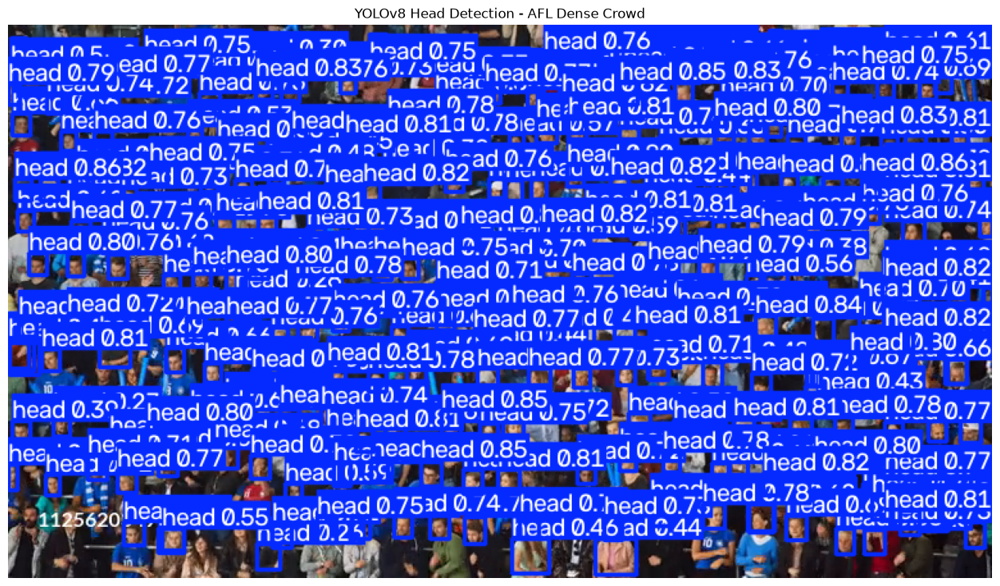

In [16]:
annotated_head = head_result.plot()

plt.figure(figsize=(16, 9))
plt.imshow(cv2.cvtColor(annotated_head, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title("YOLOv8 Head Detection - AFL Dense Crowd")
plt.show()

In [17]:
model_comparison = pd.DataFrame({
    "Model": [
        "YOLO26n COCO",
        "YOLOv8n Head Detector"
    ],
    "Object Type": [
        "Person",
        "Head"
    ],
    "Detections": [
        22,
        len(head_result.boxes)
    ]
})

model_comparison

,Model,Object Type,Detections
0,YOLO26n COCO,Person,22
1,YOLOv8n Head Detector,Head,292


## Head Detection Baseline

The YOLOv8 head-detection model was evaluated on the same AFL dense-crowd frame used for the YOLO26n baseline.

YOLO26n detected 22 full-body person instances, while the head-detection model identified 292 head instances.

The substantially higher detection count indicates that head detection is better suited to this scene because spectators are heavily occluded and full-body bounding boxes are often unavailable.

However, the higher detection count does not by itself establish better accuracy. The detections must also be evaluated for duplicate boxes, false positives and stability across consecutive frames.

Therefore, the head detector will be used as the leading candidate for the next tracking experiment.

In [18]:
# Confidence threshold experiment for the head detector

head_configs = [0.25, 0.35, 0.45, 0.50, 0.60]

head_comparison = []

for conf in head_configs:
    result = head_model.predict(
        source=frame,
        device=0,
        imgsz=832,
        conf=conf,
        iou=0.75,
        max_det=500,
        verbose=False
    )[0]

    head_comparison.append({
        "Confidence": conf,
        "Heads Detected": len(result.boxes)
    })

head_comparison_df = pd.DataFrame(head_comparison)

head_comparison_df

,Confidence,Heads Detected
0,0.25,292
1,0.35,261
2,0.45,237
3,0.50,226
4,0.60,200


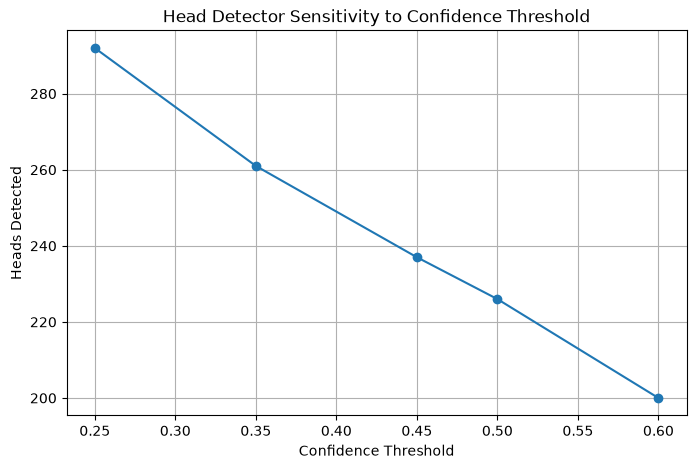

In [19]:
plt.figure(figsize=(8, 5))

plt.plot(
    head_comparison_df["Confidence"],
    head_comparison_df["Heads Detected"],
    marker="o"
)

plt.xlabel("Confidence Threshold")
plt.ylabel("Heads Detected")
plt.title("Head Detector Sensitivity to Confidence Threshold")
plt.grid(True)
plt.show()

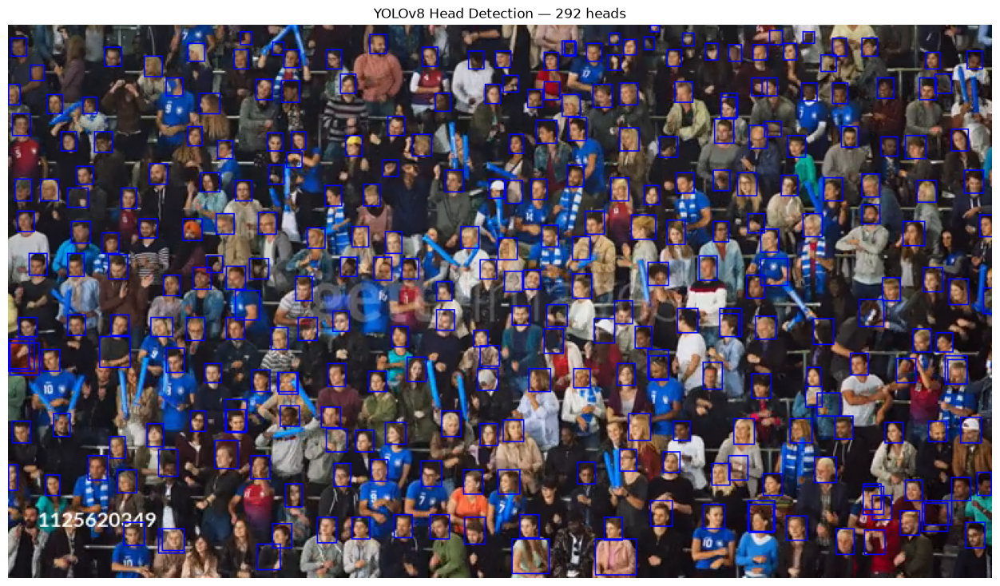

In [21]:
# Clean head detection visualization

clean_frame = frame.copy()

boxes = head_result.boxes

for box in boxes:
    x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy())

    cv2.rectangle(
        clean_frame,
        (x1, y1),
        (x2, y2),
        (255, 0, 0),
        1
    )

plt.figure(figsize=(16, 9))
plt.imshow(cv2.cvtColor(clean_frame, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title(f"YOLOv8 Head Detection — {len(boxes)} heads")
plt.show()

## Head Detector Threshold Selection

The confidence threshold was evaluated from 0.25 to 0.60 on the same AFL dense-crowd frame.

| Confidence | Heads Detected |
|------------|----------------|
| 0.25 | 292 |
| 0.35 | 261 |
| 0.45 | 237 |
| 0.50 | 226 |
| 0.60 | 200 |

A confidence threshold of 0.50 was selected as the initial operating point. It retains 226 head detections while providing a more conservative detection set than the lower thresholds.

This threshold is provisional and will be validated across video frames and different AFL camera views before being treated as the final configuration.

In [22]:
# YOLOv8 Head Detection + BoT-SORT Tracking
# Initial configuration

tracking_results = head_model.track(
    source=str(video_path),
    device=0,
    conf=0.50,
    imgsz=832,
    iou=0.75,
    tracker="botsort.yaml",
    persist=True,
    stream=True,
    verbose=False
)

print("Tracking initialized.")

Tracking initialized.


In [23]:
# Initialize BoT-SORT tracking again

tracking_results = head_model.track(
    source=str(video_path),
    device=0,
    conf=0.50,
    imgsz=832,
    iou=0.75,
    tracker="botsort.yaml",
    persist=True,
    stream=True,
    verbose=False
)

print("Tracking initialized.")

Tracking initialized.


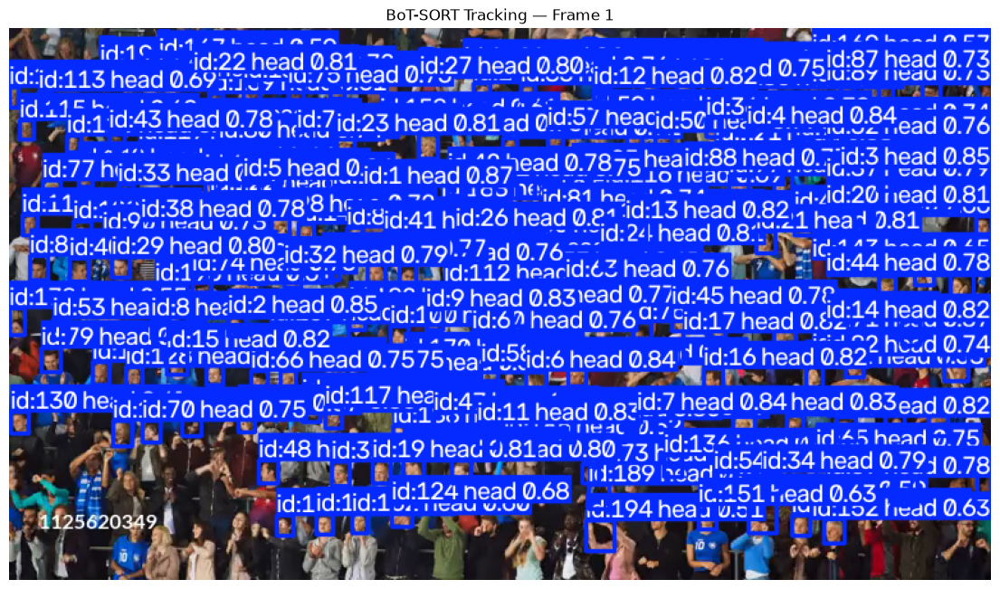

Frame 1: 196 tracked heads


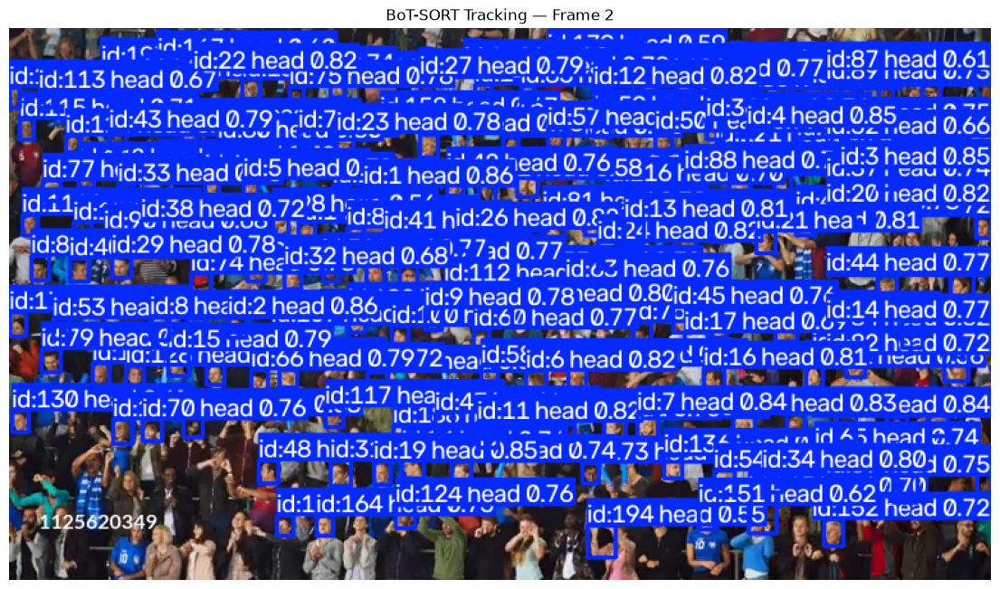

Frame 2: 173 tracked heads


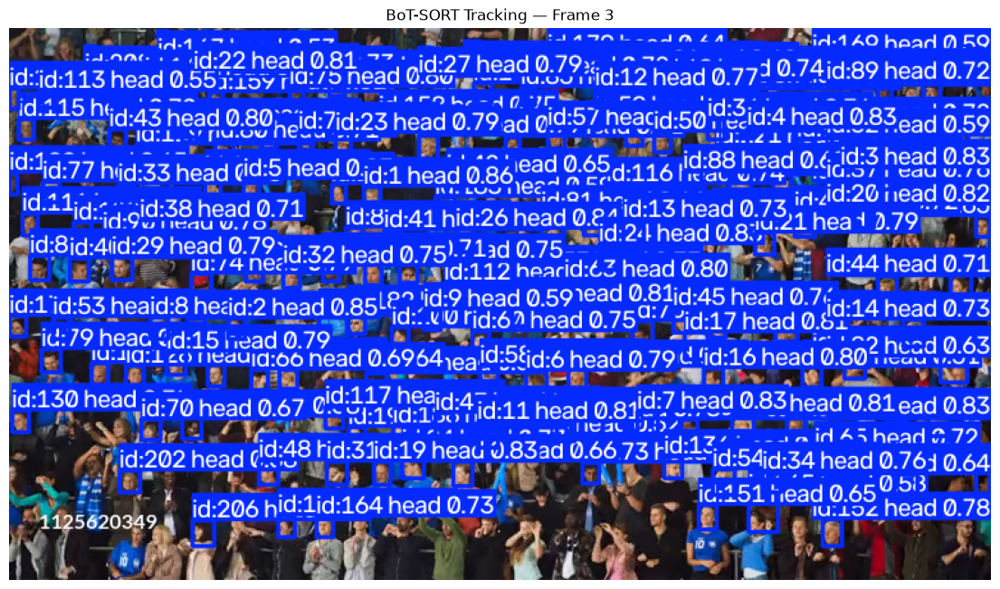

Frame 3: 170 tracked heads


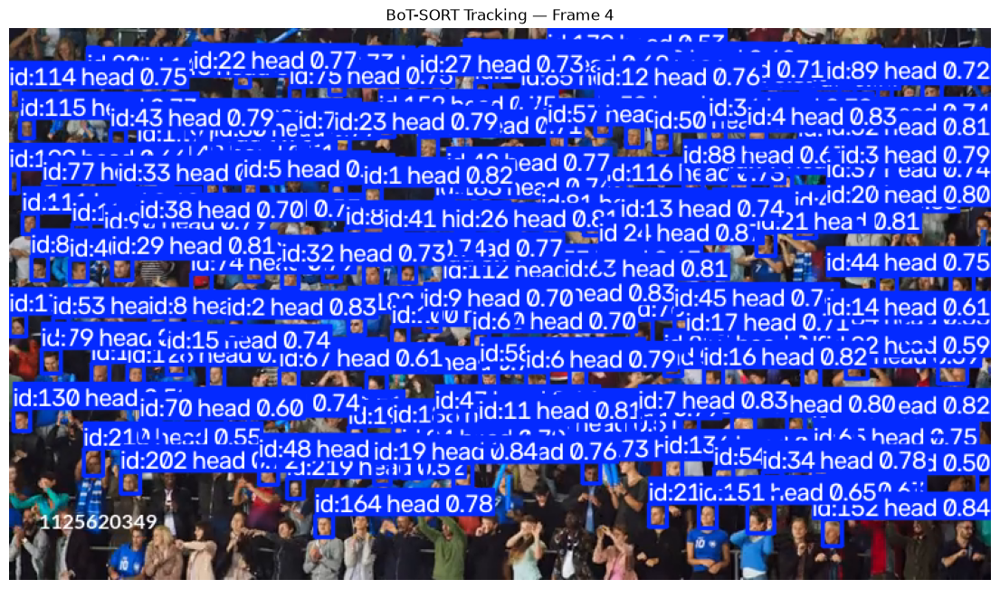

Frame 4: 165 tracked heads


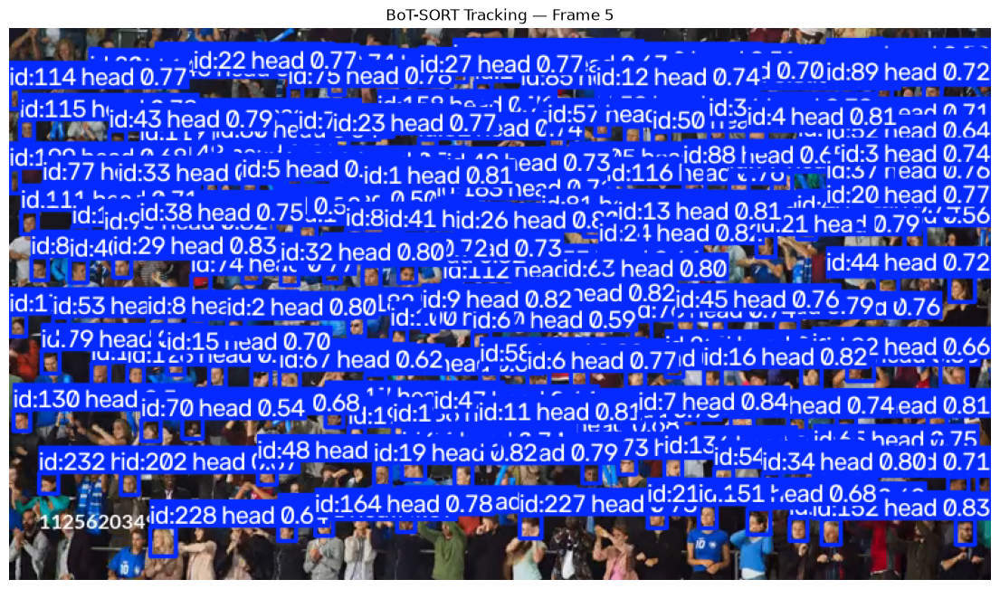

Frame 5: 178 tracked heads


In [24]:
# Inspect the first 5 tracking frames

for frame_index, result in enumerate(tracking_results):

    if frame_index >= 5:
        break

    annotated = result.plot()

    plt.figure(figsize=(14, 8))
    plt.imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title(f"BoT-SORT Tracking — Frame {frame_index + 1}")
    plt.show()

    if result.boxes.id is not None:
        track_ids = result.boxes.id.int().cpu().tolist()
        print(
            f"Frame {frame_index + 1}: "
            f"{len(track_ids)} tracked heads"
        )
    else:
        print(f"Frame {frame_index + 1}: No tracking IDs")

In [25]:
tracking_results = head_model.track(
    source=str(video_path),
    device=0,
    conf=0.50,
    imgsz=832,
    iou=0.75,
    tracker="botsort.yaml",
    persist=True,
    stream=True,
    verbose=False
)

In [26]:
# Extract head trajectories from the entire AFL video

trajectory_data = []

for frame_index, result in enumerate(tracking_results):

    if result.boxes.id is None:
        continue

    boxes = result.boxes.xyxy.cpu().numpy()
    track_ids = result.boxes.id.int().cpu().numpy()
    confidences = result.boxes.conf.cpu().numpy()

    for box, track_id, confidence in zip(
        boxes, track_ids, confidences
    ):
        x1, y1, x2, y2 = box

        center_x = (x1 + x2) / 2
        center_y = (y1 + y2) / 2

        trajectory_data.append({
            "frame": frame_index,
            "track_id": int(track_id),
            "center_x": center_x,
            "center_y": center_y,
            "confidence": float(confidence)
        })

trajectories = pd.DataFrame(trajectory_data)

print("Total tracking records:", len(trajectories))
print("Unique track IDs:", trajectories["track_id"].nunique())
print("Frames tracked:", trajectories["frame"].nunique())

trajectories.head(10)

Total tracking records: 117538
Unique track IDs: 1987
Frames tracked: 611


,frame,track_id,center_x,center_y,confidence
0,0,1,284.380341,132.355652,0.865382
1,0,2,178.125107,234.003387,0.854807
2,0,4,584.776855,86.638519,0.844170
3,0,5,189.093430,126.803467,0.843968
4,0,6,413.119141,277.990662,0.843875
5,0,7,499.288574,311.153870,0.836994
6,0,8,117.486023,235.163742,0.834514
7,0,9,331.427856,228.992065,0.828118
8,0,10,574.611450,312.461121,0.827968
9,0,11,374.805969,318.994385,0.825028


In [27]:
track_lengths = (
    trajectories
    .groupby("track_id")["frame"]
    .agg(["count", "min", "max"])
    .sort_values("count", ascending=False)
)

track_lengths.head(20)

,count,min,max
track_id,,,
36,611,0,610
40,611,0,610
4,611,0,610
6,611,0,610
77,611,0,610
25,611,0,610
79,611,0,610
111,611,0,610
109,610,0,610


In [28]:
# Calculate frame-to-frame movement for each tracked head

FPS = fps

trajectories = trajectories.sort_values(
    ["track_id", "frame"]
).copy()

trajectories["dx"] = (
    trajectories
    .groupby("track_id")["center_x"]
    .diff()
)

trajectories["dy"] = (
    trajectories
    .groupby("track_id")["center_y"]
    .diff()
)

trajectories["distance"] = np.sqrt(
    trajectories["dx"] ** 2 +
    trajectories["dy"] ** 2
)

trajectories["speed_pixels_sec"] = (
    trajectories["distance"] * FPS
)

trajectories.head(10)

,frame,track_id,center_x,center_y,confidence,dx,dy,distance,speed_pixels_sec
0,0,1,284.380341,132.355652,0.865382,NaN,NaN,NaN,NaN
193,1,1,284.358246,132.150604,0.855941,-0.022095,-0.205048,0.206235,4.944685
374,2,1,284.196655,132.383057,0.860510,-0.161591,0.232452,0.283100,6.787613
551,3,1,284.343994,132.250610,0.822556,0.147339,-0.132446,0.198118,4.750083
726,4,1,284.415710,132.499359,0.806397,0.071716,0.248749,0.258881,6.206928
912,5,1,285.170959,133.041824,0.841077,0.755249,0.542465,0.929876,22.294731
1096,6,1,284.855682,132.971008,0.843385,-0.315277,-0.070816,0.323132,7.747431
1280,7,1,284.846375,133.089066,0.867401,-0.009308,0.118057,0.118424,2.839327
1461,8,1,284.704468,133.092880,0.858948,-0.141907,0.003815,0.141958,3.403589
1644,9,1,284.734833,133.050797,0.867101,0.030365,-0.042084,0.051895,1.244232


In [29]:
frame_motion = (
    trajectories
    .groupby("frame")
    .agg(
        tracked_heads=("track_id", "nunique"),
        average_speed=("speed_pixels_sec", "mean"),
        median_speed=("speed_pixels_sec", "median")
    )
    .reset_index()
)

frame_motion.head()

,frame,tracked_heads,average_speed,median_speed
0,0,193,NaN,NaN
1,1,181,12.943212,10.634928
2,2,177,15.363129,12.507668
3,3,175,14.455750,11.113752
4,4,186,20.553753,15.659998


In [30]:
# Calculate acceleration in image-space

trajectories["acceleration_pixels_sec2"] = (
    trajectories
    .groupby("track_id")["speed_pixels_sec"]
    .diff() * FPS
)

trajectories[
    [
        "frame",
        "track_id",
        "speed_pixels_sec",
        "acceleration_pixels_sec2"
    ]
].head(15)

,frame,track_id,speed_pixels_sec,acceleration_pixels_sec2
0,0,1,NaN,NaN
193,1,1,4.944685,NaN
374,2,1,6.787613,44.186085
551,3,1,4.750083,-48.851879
726,4,1,6.206928,34.929348
912,5,1,22.294731,385.721558
1096,6,1,7.747431,-348.786438
1280,7,1,2.839327,-117.676811
1461,8,1,3.403589,13.528740
1644,9,1,1.244232,-51.772785


In [31]:
# Calculate crowd-level movement statistics per frame

frame_motion = (
    trajectories
    .groupby("frame")
    .agg(
        tracked_heads=("track_id", "nunique"),
        average_speed=("speed_pixels_sec", "mean"),
        median_speed=("speed_pixels_sec", "median"),
        max_speed=("speed_pixels_sec", "max"),
        average_acceleration=(
            "acceleration_pixels_sec2",
            "mean"
        ),
        max_acceleration=(
            "acceleration_pixels_sec2",
            "max"
        )
    )
    .reset_index()
)

frame_motion.head(10)

,frame,tracked_heads,average_speed,median_speed,max_speed,average_acceleration,max_acceleration
0,0,193,NaN,NaN,NaN,NaN,NaN
1,1,181,12.943212,10.634928,55.901756,NaN,NaN
2,2,177,15.363129,12.507668,71.621574,50.070705,1177.578857
3,3,175,14.455750,11.113752,71.703125,-41.152313,623.428345
4,4,186,20.553753,15.659998,101.265022,115.991173,1510.895508
5,5,184,25.028957,22.244438,78.798019,119.892097,1595.544189
6,6,184,21.177069,16.657507,141.474274,-103.543457,2091.893066
7,7,181,16.313385,12.599299,96.346489,-68.859406,1615.354126
8,8,183,17.223347,12.788319,98.140327,11.846635,1806.081055
9,9,184,16.957056,13.348816,97.765312,-5.061132,2214.858887


In [32]:
frame_motion = frame_motion.replace(
    [np.inf, -np.inf],
    np.nan
)

frame_motion = frame_motion.fillna(0)

frame_motion.head()

,frame,tracked_heads,average_speed,median_speed,max_speed,average_acceleration,max_acceleration
0,0,193,0.000000,0.000000,0.000000,0.000000,0.000000
1,1,181,12.943212,10.634928,55.901756,0.000000,0.000000
2,2,177,15.363129,12.507668,71.621574,50.070705,1177.578857
3,3,175,14.455750,11.113752,71.703125,-41.152313,623.428345
4,4,186,20.553753,15.659998,101.265022,115.991173,1510.895508


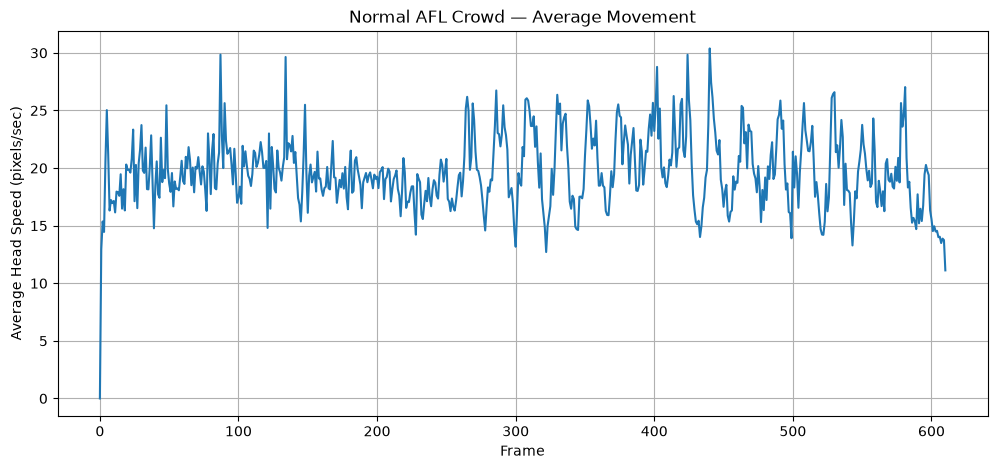

In [33]:
plt.figure(figsize=(12, 5))

plt.plot(
    frame_motion["frame"],
    frame_motion["average_speed"]
)

plt.xlabel("Frame")
plt.ylabel("Average Head Speed (pixels/sec)")
plt.title("Normal AFL Crowd — Average Movement")
plt.grid(True)
plt.show()

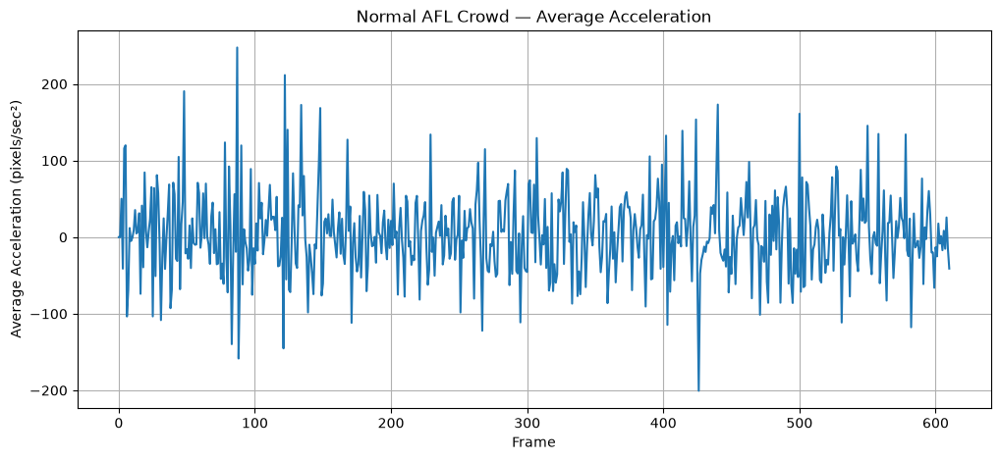

In [34]:
plt.figure(figsize=(12, 5))

plt.plot(
    frame_motion["frame"],
    frame_motion["average_acceleration"]
)

plt.xlabel("Frame")
plt.ylabel("Average Acceleration (pixels/sec²)")
plt.title("Normal AFL Crowd — Average Acceleration")
plt.grid(True)
plt.show()

In [35]:
# Calculate acceleration magnitude

trajectories["acceleration_magnitude"] = (
    trajectories["acceleration_pixels_sec2"].abs()
)

# Remove extreme values caused by tracking noise
acceleration_cap = trajectories["acceleration_magnitude"].quantile(0.99)

trajectories["acceleration_clipped"] = (
    trajectories["acceleration_magnitude"]
    .clip(upper=acceleration_cap)
)

print("99th percentile acceleration:",
      acceleration_cap)

99th percentile acceleration: 2043.93


In [36]:
frame_motion = (
    trajectories
    .groupby("frame")
    .agg(
        tracked_heads=("track_id", "nunique"),

        average_speed=(
            "speed_pixels_sec",
            "mean"
        ),

        median_speed=(
            "speed_pixels_sec",
            "median"
        ),

        max_speed=(
            "speed_pixels_sec",
            "max"
        ),

        mean_acceleration_magnitude=(
            "acceleration_clipped",
            "mean"
        ),

        median_acceleration_magnitude=(
            "acceleration_clipped",
            "median"
        ),

        max_acceleration=(
            "acceleration_clipped",
            "max"
        )
    )
    .reset_index()
)

frame_motion = frame_motion.fillna(0)

frame_motion.head(10)

,frame,tracked_heads,average_speed,median_speed,max_speed,mean_acceleration_magnitude,median_acceleration_magnitude,max_acceleration
0,0,193,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,1,181,12.943212,10.634928,55.901756,0.000000,0.000000,0.000000
2,2,177,15.363129,12.507668,71.621574,209.399780,146.049530,1177.578857
3,3,175,14.455750,11.113752,71.703125,202.500977,163.795929,1411.369995
4,4,186,20.553753,15.659998,101.265022,273.599640,160.580978,1510.895508
5,5,184,25.028957,22.244438,78.798019,320.532990,249.089890,1595.544189
6,6,184,21.177069,16.657507,141.474274,331.724701,249.162643,2043.930054
7,7,181,16.313385,12.599299,96.346489,257.277771,168.522858,1946.357056
8,8,183,17.223347,12.788319,98.140327,242.255630,160.872177,1806.081055
9,9,184,16.957056,13.348816,97.765312,216.690811,125.903099,2043.930054


In [37]:
# Smooth movement signals to reduce tracking noise

window = 7

frame_motion["speed_smoothed"] = (
    frame_motion["average_speed"]
    .rolling(window=window, center=True)
    .median()
)

frame_motion["acceleration_smoothed"] = (
    frame_motion["mean_acceleration_magnitude"]
    .rolling(window=window, center=True)
    .median()
)

frame_motion = frame_motion.fillna(0)

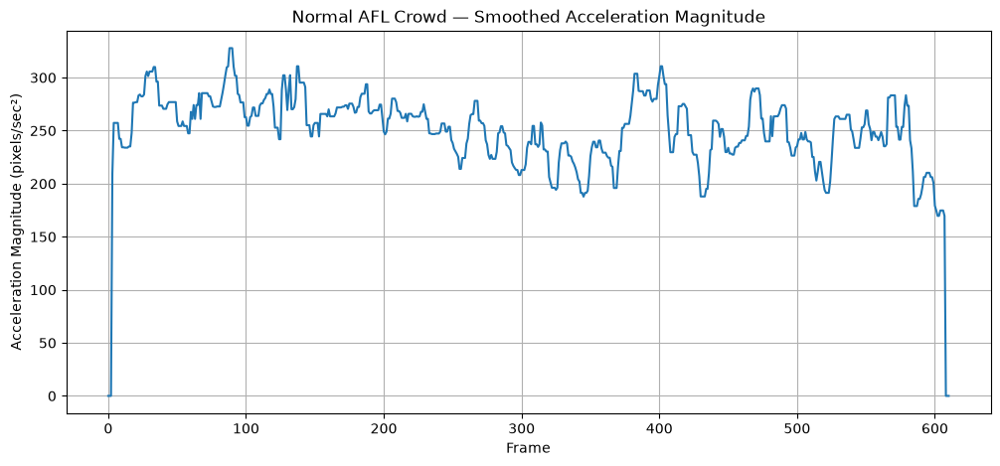

In [38]:
plt.figure(figsize=(12, 5))

plt.plot(
    frame_motion["frame"],
    frame_motion["acceleration_smoothed"]
)

plt.xlabel("Frame")
plt.ylabel("Acceleration Magnitude (pixels/sec²)")
plt.title("Normal AFL Crowd — Smoothed Acceleration Magnitude")
plt.grid(True)
plt.show()

In [77]:
# Optical Flow Analysis
# Measures overall visual motion between consecutive frames.
# Also stores the raw horizontal and vertical flow fields
# for later crowd-motion analysis.

cap = cv2.VideoCapture(str(video_path))

ret, previous_frame = cap.read()

if not ret:
    cap.release()
    raise RuntimeError("Could not read the first frame.")

previous_gray = cv2.cvtColor(
    previous_frame,
    cv2.COLOR_BGR2GRAY
)

flow_data = []
flow_fields = []

frame_number = 1

while True:

    ret, current_frame = cap.read()

    if not ret:
        break

    current_gray = cv2.cvtColor(
        current_frame,
        cv2.COLOR_BGR2GRAY
    )

    # Farneback dense optical flow
    flow = cv2.calcOpticalFlowFarneback(
        previous_gray,
        current_gray,
        None,
        0.5,
        3,
        15,
        3,
        5,
        1.2,
        0
    )

    magnitude, angle = cv2.cartToPolar(
        flow[..., 0],
        flow[..., 1]
    )

    # Ignore extremely tiny movements caused by image noise
    valid_motion = magnitude[magnitude > 0.5]

    if len(valid_motion) > 0:
        mean_motion = np.mean(valid_motion)
        median_motion = np.median(valid_motion)
        max_motion = np.percentile(valid_motion, 95)
    else:
        mean_motion = 0
        median_motion = 0
        max_motion = 0

    # Save the raw optical-flow field
    flow_fields.append(flow.copy())

    # Save summary statistics
    flow_data.append({
        "frame": frame_number,
        "mean_optical_flow": mean_motion,
        "median_optical_flow": median_motion,
        "p95_optical_flow": max_motion
    })

    previous_gray = current_gray
    frame_number += 1

cap.release()

optical_flow_df = pd.DataFrame(flow_data)

print("Optical flow calculated.")
print("Frames with flow:", len(flow_fields))
print("Flow field shape:", flow_fields[0].shape)

optical_flow_df.head()

Optical flow calculated.
Frames with flow: 610
Flow field shape: (432, 768, 2)


,frame,mean_optical_flow,median_optical_flow,p95_optical_flow
0,1,1.301386,0.999112,3.152719
1,2,1.341144,1.052024,3.184085
2,3,1.291372,1.032171,2.968752
3,4,1.243087,0.985253,2.819094
4,5,1.234786,0.997583,2.750597


In [78]:
# Smooth optical-flow signal to reduce frame-to-frame noise

optical_flow_df["flow_smoothed"] = (
    optical_flow_df["mean_optical_flow"]
    .rolling(window=7, center=True)
    .median()
)

optical_flow_df["flow_smoothed"] = (
    optical_flow_df["flow_smoothed"]
    .fillna(optical_flow_df["mean_optical_flow"])
)

optical_flow_df.head(10)

,frame,mean_optical_flow,median_optical_flow,p95_optical_flow,flow_smoothed
0,1,1.301386,0.999112,3.152719,1.301386
1,2,1.341144,1.052024,3.184085,1.341144
2,3,1.291372,1.032171,2.968752,1.291372
3,4,1.243087,0.985253,2.819094,1.252144
4,5,1.234786,0.997583,2.750597,1.247971
5,6,1.151635,0.902555,2.704862,1.246395
6,7,1.252144,0.971580,2.865234,1.246395
7,8,1.247971,0.988912,2.815646,1.246395
8,9,1.246395,0.995519,2.864162,1.246395
9,10,1.251216,1.000418,2.817153,1.247971


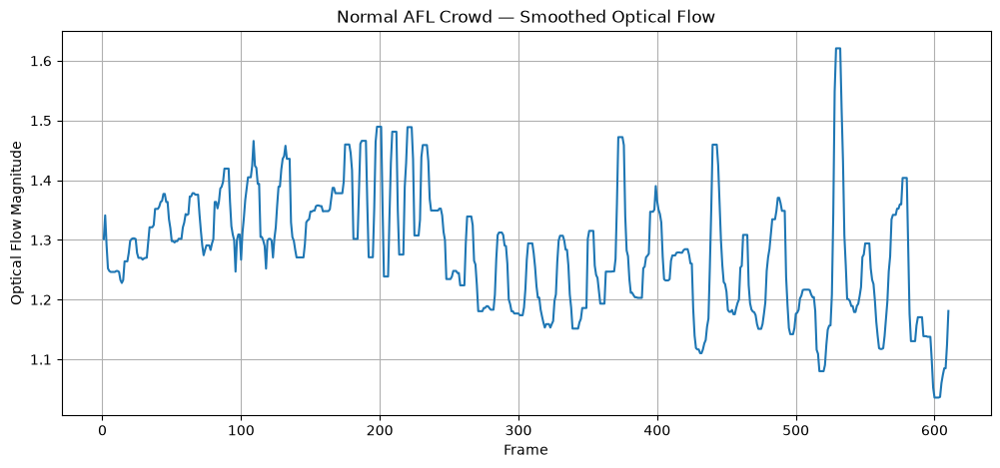

In [41]:
plt.figure(figsize=(12, 5))

plt.plot(
    optical_flow_df["frame"],
    optical_flow_df["flow_smoothed"]
)

plt.xlabel("Frame")
plt.ylabel("Optical Flow Magnitude")
plt.title("Normal AFL Crowd — Smoothed Optical Flow")
plt.grid(True)

plt.show()

In [42]:
# Calculate baseline statistics for normal AFL optical flow

flow_baseline = {
    "mean": optical_flow_df["flow_smoothed"].mean(),
    "median": optical_flow_df["flow_smoothed"].median(),
    "std": optical_flow_df["flow_smoothed"].std(),
    "95th_percentile": optical_flow_df["flow_smoothed"].quantile(0.95),
    "99th_percentile": optical_flow_df["flow_smoothed"].quantile(0.99),
    "maximum": optical_flow_df["flow_smoothed"].max()
}

flow_baseline

{'mean': np.float64(1.2805742074231632),
 'median': np.float64(1.278349757194519),
 'std': np.float64(0.10155226052851622),
 '95th_percentile': np.float64(1.4597868919372559),
 '99th_percentile': np.float64(1.4895353317260742),
 'maximum': np.float64(1.6207720041275024)}

In [43]:
# Combine tracking features with optical-flow features

crowd_features = frame_motion.merge(
    optical_flow_df[
        [
            "frame",
            "mean_optical_flow",
            "flow_smoothed"
        ]
    ],
    on="frame",
    how="left"
)

print("Crowd feature shape:", crowd_features.shape)

crowd_features.head(10)

Crowd feature shape: (611, 12)


,frame,tracked_heads,average_speed,median_speed,max_speed,mean_acceleration_magnitude,median_acceleration_magnitude,max_acceleration,speed_smoothed,acceleration_smoothed,mean_optical_flow,flow_smoothed
0,0,193,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN
1,1,181,12.943212,10.634928,55.901756,0.000000,0.000000,0.000000,0.000000,0.000000,1.301386,1.301386
2,2,177,15.363129,12.507668,71.621574,209.399780,146.049530,1177.578857,0.000000,0.000000,1.341144,1.341144
3,3,175,14.455750,11.113752,71.703125,202.500977,163.795929,1411.369995,15.363129,209.399780,1.291372,1.291372
4,4,186,20.553753,15.659998,101.265022,273.599640,160.580978,1510.895508,16.313385,257.277771,1.243087,1.252144
5,5,184,25.028957,22.244438,78.798019,320.532990,249.089890,1595.544189,17.223347,257.277771,1.234786,1.247971
6,6,184,21.177069,16.657507,141.474274,331.724701,249.162643,2043.930054,17.223347,257.277771,1.151635,1.246395
7,7,181,16.313385,12.599299,96.346489,257.277771,168.522858,1946.357056,17.223347,257.277771,1.252144,1.246395
8,8,183,17.223347,12.788319,98.140327,242.255630,160.872177,1806.081055,17.142620,242.255630,1.247971,1.246395
9,9,184,16.957056,13.348816,97.765312,216.690811,125.903099,2043.930054,17.142620,242.255630,1.246395,1.246395


In [46]:
# Recreate movement direction from dx and dy

trajectories["direction"] = np.arctan2(
    trajectories["dy"],
    trajectories["dx"]
)

print("Direction column created.")

trajectories[
    ["frame", "track_id", "dx", "dy", "direction"]
].head(10)

Direction column created.


,frame,track_id,dx,dy,direction
0,0,1,NaN,NaN,NaN
193,1,1,-0.022095,-0.205048,-1.678136
374,2,1,-0.161591,0.232452,2.178264
551,3,1,0.147339,-0.132446,-0.732220
726,4,1,0.071716,0.248749,1.290100
912,5,1,0.755249,0.542465,0.622876
1096,6,1,-0.315277,-0.070816,-2.920645
1280,7,1,-0.009308,0.118057,1.649475
1461,8,1,-0.141907,0.003815,3.114717
1644,9,1,0.030365,-0.042084,-0.945762


In [47]:
# Calculate how consistently the crowd is moving in the same direction

def directional_consistency(group):
    valid = group[group["distance"] > 0.5]

    if len(valid) < 5:
        return 0.0

    angles = valid["direction"].values

    x = np.cos(angles).mean()
    y = np.sin(angles).mean()

    return np.sqrt(x**2 + y**2)


direction_consistency = (
    trajectories
    .groupby("frame")
    .apply(
        directional_consistency,
        include_groups=False
    )
    .reset_index(name="direction_consistency")
)

direction_consistency.head(10)

,frame,direction_consistency
0,0,0.000000
1,1,0.394146
2,2,0.459645
3,3,0.100067
4,4,0.571826
5,5,0.800773
6,6,0.561063
7,7,0.279373
8,8,0.367576
9,9,0.138948


In [48]:
# Calculate movement direction for every tracked head

trajectories["direction"] = np.arctan2(
    trajectories["dy"],
    trajectories["dx"]
)

print("Direction column created.")
print(
    trajectories[
        ["frame", "track_id", "dx", "dy", "direction"]
    ].head(10)
)

Direction column created.
      frame  track_id        dx        dy  direction
0         0         1       NaN       NaN        NaN
193       1         1 -0.022095 -0.205048  -1.678136
374       2         1 -0.161591  0.232452   2.178264
551       3         1  0.147339 -0.132446  -0.732220
726       4         1  0.071716  0.248749   1.290100
912       5         1  0.755249  0.542465   0.622876
1096      6         1 -0.315277 -0.070816  -2.920645
1280      7         1 -0.009308  0.118057   1.649475
1461      8         1 -0.141907  0.003815   3.114717
1644      9         1  0.030365 -0.042084  -0.945762


In [49]:
# Calculate crowd directional consistency for each frame

def directional_consistency(group):
    valid = group[
        (group["distance"] > 0.5) &
        (group["direction"].notna())
    ]

    if len(valid) < 5:
        return 0.0

    angles = valid["direction"].values

    x = np.cos(angles).mean()
    y = np.sin(angles).mean()

    return np.sqrt(x**2 + y**2)


direction_consistency = (
    trajectories
    .groupby("frame")
    .apply(
        directional_consistency,
        include_groups=False
    )
    .reset_index(name="direction_consistency")
)

print(direction_consistency.head(10))
print("\nFrames calculated:", len(direction_consistency))

   frame  direction_consistency
0      0               0.000000
1      1               0.394146
2      2               0.459645
3      3               0.100067
4      4               0.571826
5      5               0.800773
6      6               0.561063
7      7               0.279373
8      8               0.367576
9      9               0.138948

Frames calculated: 611


In [50]:
# Add directional consistency to the combined crowd features

crowd_features = crowd_features.merge(
    direction_consistency,
    on="frame",
    how="left"
)

crowd_features["direction_consistency"] = (
    crowd_features["direction_consistency"]
    .fillna(0)
)

print("Updated feature shape:", crowd_features.shape)

crowd_features[
    [
        "frame",
        "tracked_heads",
        "speed_smoothed",
        "acceleration_smoothed",
        "flow_smoothed",
        "direction_consistency"
    ]
].head(10)

Updated feature shape: (611, 13)


,frame,tracked_heads,speed_smoothed,acceleration_smoothed,flow_smoothed,direction_consistency
0,0,193,0.000000,0.000000,NaN,0.000000
1,1,181,0.000000,0.000000,1.301386,0.394146
2,2,177,0.000000,0.000000,1.341144,0.459645
3,3,175,15.363129,209.399780,1.291372,0.100067
4,4,186,16.313385,257.277771,1.252144,0.571826
5,5,184,17.223347,257.277771,1.247971,0.800773
6,6,184,17.223347,257.277771,1.246395,0.561063
7,7,181,17.223347,257.277771,1.246395,0.279373
8,8,183,17.142620,242.255630,1.246395,0.367576
9,9,184,17.142620,242.255630,1.246395,0.138948


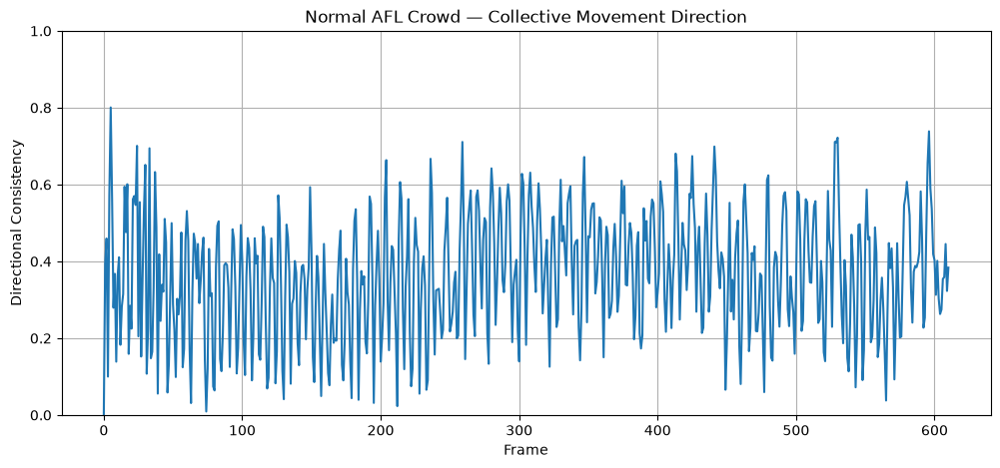

In [51]:
# Plot collective movement direction

plt.figure(figsize=(12, 5))

plt.plot(
    crowd_features["frame"],
    crowd_features["direction_consistency"]
)

plt.xlabel("Frame")
plt.ylabel("Directional Consistency")
plt.title("Normal AFL Crowd — Collective Movement Direction")
plt.ylim(0, 1)
plt.grid(True)

plt.show()

In [52]:
# Calculate baseline statistics for directional consistency

direction_baseline = {
    "mean": crowd_features["direction_consistency"].mean(),
    "median": crowd_features["direction_consistency"].median(),
    "std": crowd_features["direction_consistency"].std(),
    "95th_percentile": crowd_features["direction_consistency"].quantile(0.95),
    "99th_percentile": crowd_features["direction_consistency"].quantile(0.99),
    "maximum": crowd_features["direction_consistency"].max()
}

direction_baseline

{'mean': np.float64(0.36442352564313407),
 'median': np.float64(0.36831915378570557),
 'std': np.float64(0.15709645666146207),
 '95th_percentile': np.float64(0.6020170748233795),
 '99th_percentile': np.float64(0.7005906581878661),
 'maximum': np.float64(0.8007729053497314)}

In [53]:
# Create the core crowd-behaviour feature table

core_features = crowd_features[
    [
        "frame",
        "tracked_heads",
        "speed_smoothed",
        "acceleration_smoothed",
        "flow_smoothed",
        "direction_consistency"
    ]
].copy()

print("Core feature shape:", core_features.shape)

core_features.head(10)

Core feature shape: (611, 6)


,frame,tracked_heads,speed_smoothed,acceleration_smoothed,flow_smoothed,direction_consistency
0,0,193,0.000000,0.000000,NaN,0.000000
1,1,181,0.000000,0.000000,1.301386,0.394146
2,2,177,0.000000,0.000000,1.341144,0.459645
3,3,175,15.363129,209.399780,1.291372,0.100067
4,4,186,16.313385,257.277771,1.252144,0.571826
5,5,184,17.223347,257.277771,1.247971,0.800773
6,6,184,17.223347,257.277771,1.246395,0.561063
7,7,181,17.223347,257.277771,1.246395,0.279373
8,8,183,17.142620,242.255630,1.246395,0.367576
9,9,184,17.142620,242.255630,1.246395,0.138948


In [54]:
# Clean edge values before further analysis

core_features = core_features.copy()

# Replace missing optical-flow values with the first valid value
core_features["flow_smoothed"] = (
    core_features["flow_smoothed"]
    .bfill()
    .ffill()
)

# Remove artificial zero values created by the rolling window
# by replacing them with the first meaningful value
for column in ["speed_smoothed", "acceleration_smoothed"]:
    first_valid = core_features.loc[
        core_features[column] > 0, column
    ].iloc[0]

    core_features[column] = core_features[column].replace(
        0,
        first_valid
    )

print(core_features.head(10))

   frame  tracked_heads  speed_smoothed  acceleration_smoothed  flow_smoothed  \
0      0            193       15.363129             209.399780       1.301386   
1      1            181       15.363129             209.399780       1.301386   
2      2            177       15.363129             209.399780       1.341144   
3      3            175       15.363129             209.399780       1.291372   
4      4            186       16.313385             257.277771       1.252144   
5      5            184       17.223347             257.277771       1.247971   
6      6            184       17.223347             257.277771       1.246395   
7      7            181       17.223347             257.277771       1.246395   
8      8            183       17.142620             242.255630       1.246395   
9      9            184       17.142620             242.255630       1.246395   

   direction_consistency  
0               0.000000  
1               0.394146  
2               0.459645  


In [55]:
# Remove the edge frames affected by rolling-window initialization

analysis_features = core_features[
    (core_features["frame"] >= 3) &
    (core_features["frame"] <= 607)
].copy()

analysis_features = analysis_features.reset_index(drop=True)

print("Analysis feature shape:", analysis_features.shape)
print(analysis_features.head())
print("\nLast rows:")
print(analysis_features.tail())

Analysis feature shape: (605, 6)
   frame  tracked_heads  speed_smoothed  acceleration_smoothed  flow_smoothed  \
0      3            175       15.363129             209.399780       1.291372   
1      4            186       16.313385             257.277771       1.252144   
2      5            184       17.223347             257.277771       1.247971   
3      6            184       17.223347             257.277771       1.246395   
4      7            181       17.223347             257.277771       1.246395   

   direction_consistency  
0               0.100067  
1               0.571826  
2               0.800773  
3               0.561063  
4               0.279373  

Last rows:
     frame  tracked_heads  speed_smoothed  acceleration_smoothed  \
600    603            203       14.525650             169.670624   
601    604            203       14.493831             174.772125   
602    605            207       14.037807             174.772125   
603    606            209       13

In [56]:
# Normal AFL baseline statistics

baseline_stats = analysis_features[
    [
        "tracked_heads",
        "speed_smoothed",
        "acceleration_smoothed",
        "flow_smoothed",
        "direction_consistency"
    ]
].describe(
    percentiles=[0.50, 0.90, 0.95, 0.99]
).T

baseline_stats

,count,mean,std,min,50%,90%,95%,99%,max
tracked_heads,605.0,192.335537,20.846208,141.000000,192.000000,219.000000,222.000000,228.000000,231.000000
speed_smoothed,605.0,19.645930,2.250909,13.873775,19.388929,22.944105,23.776600,24.975838,25.545637
acceleration_smoothed,605.0,252.215584,29.670881,169.670624,255.129425,285.671698,295.989490,310.682424,327.754272
flow_smoothed,605.0,1.281186,0.101345,1.036007,1.278567,1.419388,1.459787,1.489535,1.620772
direction_consistency,605.0,0.364722,0.157079,0.009253,0.367576,0.569581,0.602776,0.700699,0.800773


In [57]:
# Standardize crowd features relative to the normal AFL baseline

features_to_standardize = [
    "tracked_heads",
    "speed_smoothed",
    "acceleration_smoothed",
    "flow_smoothed",
    "direction_consistency"
]

for feature in features_to_standardize:
    mean = analysis_features[feature].mean()
    std = analysis_features[feature].std()

    analysis_features[f"{feature}_z"] = (
        (analysis_features[feature] - mean) / std
    )

analysis_features.head()

,frame,tracked_heads,speed_smoothed,acceleration_smoothed,flow_smoothed,direction_consistency,tracked_heads_z,speed_smoothed_z,acceleration_smoothed_z,flow_smoothed_z,direction_consistency_z
0,3,175,15.363129,209.399780,1.291372,0.100067,-0.831592,-1.902698,-1.443024,0.100506,-1.684860
1,4,186,16.313385,257.277771,1.252144,0.571826,-0.303918,-1.480533,0.170611,-0.286566,1.318471
2,5,184,17.223347,257.277771,1.247971,0.800773,-0.399859,-1.076269,0.170611,-0.327736,2.775999
3,6,184,17.223347,257.277771,1.246395,0.561063,-0.399859,-1.076269,0.170611,-0.343289,1.249951
4,7,181,17.223347,257.277771,1.246395,0.279373,-0.543770,-1.076269,0.170611,-0.343289,-0.543354


In [58]:
# Experimental crowd-risk score
# This is a prototype baseline, not a trained stampede classifier.

analysis_features["risk_score"] = (
    0.30 * analysis_features["speed_smoothed_z"] +
    0.25 * analysis_features["flow_smoothed_z"] +
    0.20 * analysis_features["acceleration_smoothed_z"] +
    0.20 * analysis_features["direction_consistency_z"] +
    0.05 * analysis_features["tracked_heads_z"]
)

analysis_features[
    [
        "frame",
        "speed_smoothed_z",
        "flow_smoothed_z",
        "acceleration_smoothed_z",
        "direction_consistency_z",
        "risk_score"
    ]
].head(10)

,frame,speed_smoothed_z,flow_smoothed_z,acceleration_smoothed_z,direction_consistency_z,risk_score
0,3,-1.902698,0.100506,-1.443024,-1.684860,-1.212839
1,4,-1.480533,-0.286566,0.170611,1.318471,-0.233181
2,5,-1.076269,-0.327736,0.170611,2.775999,0.164514
3,6,-1.076269,-0.343289,0.170611,1.249951,-0.144583
4,7,-1.076269,-0.343289,0.170611,-0.543354,-0.510440
5,8,-1.112133,-0.343289,-0.335681,0.018165,-0.505357
6,9,-1.112133,-0.343289,-0.335681,-1.437333,-0.794058
7,10,-1.112133,-0.327736,-0.603850,-0.020873,-0.565308
8,11,-1.076269,-0.327736,-0.603850,0.291820,-0.506402
9,12,-0.913571,-0.343289,-0.615422,-1.157755,-0.758507


In [59]:
# Examine the experimental risk-score distribution
# using the normal AFL video.

risk_baseline = {
    "mean": analysis_features["risk_score"].mean(),
    "median": analysis_features["risk_score"].median(),
    "std": analysis_features["risk_score"].std(),
    "90th_percentile": analysis_features["risk_score"].quantile(0.90),
    "95th_percentile": analysis_features["risk_score"].quantile(0.95),
    "99th_percentile": analysis_features["risk_score"].quantile(0.99),
    "maximum": analysis_features["risk_score"].max()
}

risk_baseline

{'mean': np.float64(-2.759959386836753e-16),
 'median': np.float64(0.036875645150162284),
 'std': np.float64(0.6432974473982928),
 '90th_percentile': np.float64(0.7380858008544209),
 '95th_percentile': np.float64(1.0194327566092851),
 '99th_percentile': np.float64(1.4697119958547864),
 'maximum': np.float64(1.722057376328904)}

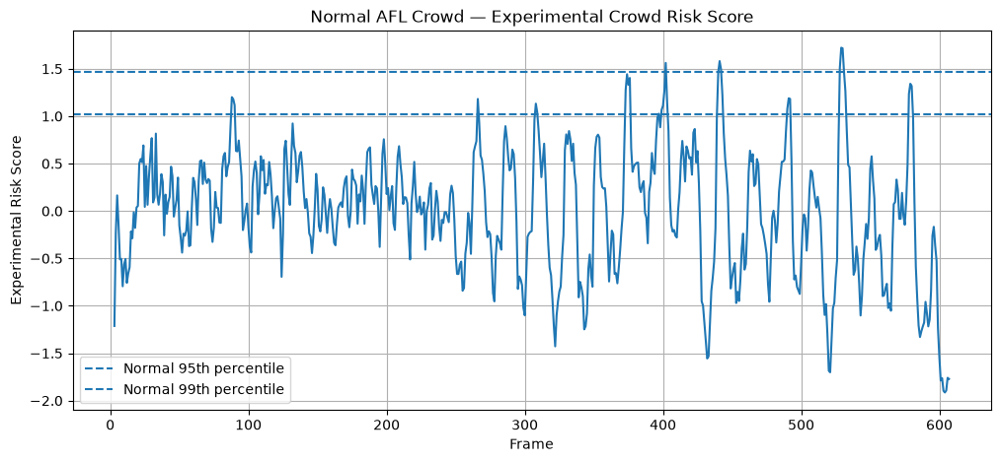

In [60]:
# Plot experimental risk score across the normal AFL clip

plt.figure(figsize=(12, 5))

plt.plot(
    analysis_features["frame"],
    analysis_features["risk_score"]
)

plt.axhline(
    risk_baseline["95th_percentile"],
    linestyle="--",
    label="Normal 95th percentile"
)

plt.axhline(
    risk_baseline["99th_percentile"],
    linestyle="--",
    label="Normal 99th percentile"
)

plt.xlabel("Frame")
plt.ylabel("Experimental Risk Score")
plt.title("Normal AFL Crowd — Experimental Crowd Risk Score")
plt.legend()
plt.grid(True)

plt.show()

In [61]:
# Measure persistence of elevated risk in the normal AFL clip

threshold_95 = risk_baseline["95th_percentile"]

analysis_features["above_95"] = (
    analysis_features["risk_score"] > threshold_95
)

# Calculate consecutive-frame run lengths
groups = (
    analysis_features["above_95"] !=
    analysis_features["above_95"].shift()
).cumsum()

run_lengths = (
    analysis_features
    .groupby(groups)
    .agg(
        above_95=("above_95", "first"),
        frames=("above_95", "size")
    )
)

normal_high_risk_runs = run_lengths[
    run_lengths["above_95"] == True
]

normal_high_risk_runs.sort_values(
    "frames",
    ascending=False
).head(10)

,above_95,frames
above_95,,
18,True,5
12,True,5
14,True,4
8,True,4
16,True,3
2,True,3
20,True,3
6,True,2
4,True,1


In [62]:
# Measure persistence above the normal 99th-percentile threshold

threshold_99 = risk_baseline["99th_percentile"]

analysis_features["above_99"] = (
    analysis_features["risk_score"] > threshold_99
)

groups_99 = (
    analysis_features["above_99"] !=
    analysis_features["above_99"].shift()
).cumsum()

run_lengths_99 = (
    analysis_features
    .groupby(groups_99)
    .agg(
        above_99=("above_99", "first"),
        frames=("above_99", "size")
    )
)

normal_extreme_runs = run_lengths_99[
    run_lengths_99["above_99"] == True
]

normal_extreme_runs.sort_values(
    "frames",
    ascending=False
).head(10)

,above_99,frames
above_99,,
6,True,4
4,True,2
2,True,1


In [63]:
# Summarize normal-crowd persistence behaviour

max_run_95 = normal_high_risk_runs["frames"].max()
max_run_99 = normal_extreme_runs["frames"].max()

print(f"Longest normal run above 95th percentile: {max_run_95} frames")
print(f"Longest normal run above 99th percentile: {max_run_99} frames")

print(f"At {FPS:.2f} FPS:")
print(f"95th percentile: {max_run_95 / FPS:.2f} seconds")
print(f"99th percentile: {max_run_99 / FPS:.2f} seconds")

Longest normal run above 95th percentile: 5 frames
Longest normal run above 99th percentile: 4 frames
At 23.98 FPS:
95th percentile: 0.21 seconds
99th percentile: 0.17 seconds


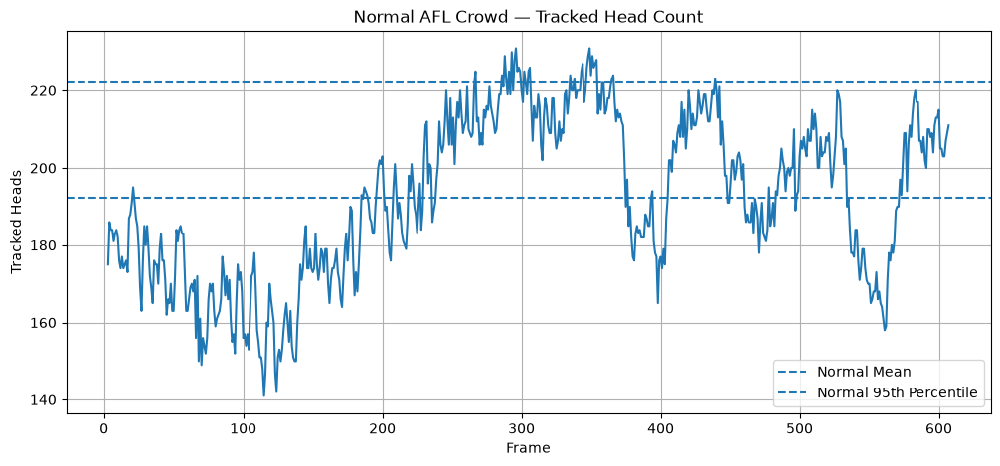

In [64]:
# Normal AFL crowd — tracked head count

plt.figure(figsize=(12, 5))

plt.plot(
    analysis_features["frame"],
    analysis_features["tracked_heads"]
)

plt.axhline(
    analysis_features["tracked_heads"].mean(),
    linestyle="--",
    label="Normal Mean"
)

plt.axhline(
    analysis_features["tracked_heads"].quantile(0.95),
    linestyle="--",
    label="Normal 95th Percentile"
)

plt.xlabel("Frame")
plt.ylabel("Tracked Heads")
plt.title("Normal AFL Crowd — Tracked Head Count")
plt.legend()
plt.grid(True)

plt.show()

In [65]:
# Normal AFL crowd-count baseline

count_baseline = {
    "mean": analysis_features["tracked_heads"].mean(),
    "median": analysis_features["tracked_heads"].median(),
    "std": analysis_features["tracked_heads"].std(),
    "90th_percentile": analysis_features["tracked_heads"].quantile(0.90),
    "95th_percentile": analysis_features["tracked_heads"].quantile(0.95),
    "99th_percentile": analysis_features["tracked_heads"].quantile(0.99),
    "minimum": analysis_features["tracked_heads"].min(),
    "maximum": analysis_features["tracked_heads"].max()
}

count_baseline

{'mean': np.float64(192.33553719008265),
 'median': np.float64(192.0),
 'std': np.float64(20.846207825707886),
 '90th_percentile': np.float64(219.0),
 '95th_percentile': np.float64(222.0),
 '99th_percentile': np.float64(228.0),
 'minimum': np.int64(141),
 'maximum': np.int64(231)}

In [66]:
# Normalized crowd-density score

count_mean = count_baseline["mean"]
count_std = count_baseline["std"]

analysis_features["density_z"] = (
    (analysis_features["tracked_heads"] - count_mean)
    / count_std
)

analysis_features[
    [
        "frame",
        "tracked_heads",
        "density_z"
    ]
].head(10)

,frame,tracked_heads,density_z
0,3,175,-0.831592
1,4,186,-0.303918
2,5,184,-0.399859
3,6,184,-0.399859
4,7,181,-0.543770
5,8,183,-0.447829
6,9,184,-0.399859
7,10,182,-0.495799
8,11,176,-0.783622
9,12,174,-0.879562


In [67]:
# Calculate frame-to-frame change in crowd density

analysis_features["density_change"] = (
    analysis_features["tracked_heads"].diff()
)

analysis_features["density_change_smoothed"] = (
    analysis_features["density_change"]
    .rolling(window=7, center=True)
    .median()
    .bfill()
    .ffill()
)

analysis_features[
    [
        "frame",
        "tracked_heads",
        "density_z",
        "density_change",
        "density_change_smoothed"
    ]
].head(15)

,frame,tracked_heads,density_z,density_change,density_change_smoothed
0,3,175,-0.831592,NaN,0.0
1,4,186,-0.303918,11.0,0.0
2,5,184,-0.399859,-2.0,0.0
3,6,184,-0.399859,0.0,0.0
4,7,181,-0.543770,-3.0,0.0
5,8,183,-0.447829,2.0,-2.0
6,9,184,-0.399859,1.0,-2.0
7,10,182,-0.495799,-2.0,-2.0
8,11,176,-0.783622,-6.0,-2.0
9,12,174,-0.879562,-2.0,-2.0


In [68]:
# Examine normal crowd-density change

density_change_baseline = {
    "mean": analysis_features["density_change_smoothed"].mean(),
    "median": analysis_features["density_change_smoothed"].median(),
    "std": analysis_features["density_change_smoothed"].std(),
    "90th_percentile": analysis_features["density_change_smoothed"].quantile(0.90),
    "95th_percentile": analysis_features["density_change_smoothed"].quantile(0.95),
    "99th_percentile": analysis_features["density_change_smoothed"].quantile(0.99),
    "minimum": analysis_features["density_change_smoothed"].min(),
    "maximum": analysis_features["density_change_smoothed"].max()
}

density_change_baseline

{'mean': np.float64(0.024793388429752067),
 'median': np.float64(0.0),
 'std': np.float64(2.534734889272764),
 '90th_percentile': np.float64(3.0),
 '95th_percentile': np.float64(4.7999999999999545),
 '99th_percentile': np.float64(6.0),
 'minimum': np.float64(-8.0),
 'maximum': np.float64(7.0)}

In [69]:
# Add density-change features to the core analysis table

analysis_features["density_change_z"] = (
    analysis_features["density_change_smoothed"]
    / density_change_baseline["std"]
)

analysis_features[
    [
        "frame",
        "tracked_heads",
        "density_z",
        "density_change_smoothed",
        "density_change_z"
    ]
].head(15)

,frame,tracked_heads,density_z,density_change_smoothed,density_change_z
0,3,175,-0.831592,0.0,0.000000
1,4,186,-0.303918,0.0,0.000000
2,5,184,-0.399859,0.0,0.000000
3,6,184,-0.399859,0.0,0.000000
4,7,181,-0.543770,0.0,0.000000
5,8,183,-0.447829,-2.0,-0.789037
6,9,184,-0.399859,-2.0,-0.789037
7,10,182,-0.495799,-2.0,-0.789037
8,11,176,-0.783622,-2.0,-0.789037
9,12,174,-0.879562,-2.0,-0.789037


In [70]:
# Inspect the complete feature set

feature_columns = [
    "frame",
    "tracked_heads",
    "speed_smoothed",
    "acceleration_smoothed",
    "flow_smoothed",
    "direction_consistency",
    "density_z",
    "density_change_smoothed",
    "density_change_z",
    "risk_score"
]

analysis_features[feature_columns].head(10)

,frame,tracked_heads,speed_smoothed,acceleration_smoothed,flow_smoothed,direction_consistency,density_z,density_change_smoothed,density_change_z,risk_score
0,3,175,15.363129,209.399780,1.291372,0.100067,-0.831592,0.0,0.000000,-1.212839
1,4,186,16.313385,257.277771,1.252144,0.571826,-0.303918,0.0,0.000000,-0.233181
2,5,184,17.223347,257.277771,1.247971,0.800773,-0.399859,0.0,0.000000,0.164514
3,6,184,17.223347,257.277771,1.246395,0.561063,-0.399859,0.0,0.000000,-0.144583
4,7,181,17.223347,257.277771,1.246395,0.279373,-0.543770,0.0,0.000000,-0.510440
5,8,183,17.142620,242.255630,1.246395,0.367576,-0.447829,-2.0,-0.789037,-0.505357
6,9,184,17.142620,242.255630,1.246395,0.138948,-0.399859,-2.0,-0.789037,-0.794058
7,10,182,17.142620,234.298828,1.247971,0.361444,-0.495799,-2.0,-0.789037,-0.565308
8,11,176,17.223347,234.298828,1.247971,0.410561,-0.783622,-2.0,-0.789037,-0.506402
9,12,174,17.589563,233.955460,1.246395,0.182864,-0.879562,-2.0,-0.789037,-0.758507


In [71]:
# Check how optical-flow data is currently stored

print("Variables containing 'flow':")
print([name for name in globals() if "flow" in name.lower()])

print("\nVariables containing 'optical':")
print([name for name in globals() if "optical" in name.lower()])

Variables containing 'flow':
['flow_data', 'flow', 'optical_flow_df', 'flow_baseline']

Variables containing 'optical':
['optical_flow_df']


In [72]:
print("flow_data type:", type(flow_data))
print("flow type:", type(flow))
print("optical_flow_df type:", type(optical_flow_df))

print("\n--- optical_flow_df ---")
print(optical_flow_df.head())

print("\n--- optical_flow_df columns ---")
print(optical_flow_df.columns.tolist())

flow_data type: <class 'list'>
flow type: <class 'numpy.ndarray'>
optical_flow_df type: <class 'pandas.DataFrame'>

--- optical_flow_df ---
   frame  mean_optical_flow  median_optical_flow  p95_optical_flow  \
0      1           1.301386             0.999112          3.152719   
1      2           1.341144             1.052024          3.184085   
2      3           1.291372             1.032171          2.968752   
3      4           1.243087             0.985253          2.819094   
4      5           1.234786             0.997583          2.750597   

   flow_smoothed  
0       1.301386  
1       1.341144  
2       1.291372  
3       1.252144  
4       1.247971  

--- optical_flow_df columns ---
['frame', 'mean_optical_flow', 'median_optical_flow', 'p95_optical_flow', 'flow_smoothed']


In [73]:
print(flow.shape)

(432, 768, 2)


In [75]:
print("Number of flow records:", len(flow_data))

print("\nFirst record type:")
print(type(flow_data[0]))

print("\nFirst record:")
print(flow_data[0])

Number of flow records: 610

First record type:
<class 'dict'>

First record:
{'frame': 1, 'mean_optical_flow': np.float32(1.3013855), 'median_optical_flow': np.float32(0.9991121), 'p95_optical_flow': np.float32(3.152719)}


In [76]:
{
    'frame': 1,
    'mean_optical_flow': 1.3013855,
    'median_optical_flow': 0.9991121,
    'p95_optical_flow': 3.152719
}

{'frame': 1,
 'mean_optical_flow': 1.3013855,
 'median_optical_flow': 0.9991121,
 'p95_optical_flow': 3.152719}

In [79]:
# Calculate optical-flow divergence for every frame
#
# Divergence measures local expansion/contraction of the
# optical-flow field:
#
# positive  -> outward / expanding motion
# negative  -> inward / contracting motion
# near zero -> little net expansion/contraction

divergence_data = []

for frame_number, flow_field in enumerate(flow_fields, start=1):

    # Horizontal and vertical flow components
    u = flow_field[..., 0]
    v = flow_field[..., 1]

    # Spatial gradients
    du_dx = np.gradient(u, axis=1)
    dv_dy = np.gradient(v, axis=0)

    # Divergence = ∂u/∂x + ∂v/∂y
    divergence = du_dx + dv_dy

    # Ignore extremely small/noisy flow regions
    magnitude = np.sqrt(u**2 + v**2)
    valid = magnitude > 0.5

    if np.any(valid):
        valid_divergence = divergence[valid]

        divergence_data.append({
            "frame": frame_number,
            "mean_flow_divergence": np.mean(valid_divergence),
            "median_flow_divergence": np.median(valid_divergence),
            "p95_flow_divergence": np.percentile(
                valid_divergence, 95
            ),
            "p05_flow_divergence": np.percentile(
                valid_divergence, 5
            )
        })
    else:
        divergence_data.append({
            "frame": frame_number,
            "mean_flow_divergence": 0.0,
            "median_flow_divergence": 0.0,
            "p95_flow_divergence": 0.0,
            "p05_flow_divergence": 0.0
        })

flow_divergence_df = pd.DataFrame(divergence_data)

print("Flow divergence calculated.")
print("Frames:", len(flow_divergence_df))

flow_divergence_df.head(10)

Flow divergence calculated.
Frames: 610


,frame,mean_flow_divergence,median_flow_divergence,p95_flow_divergence,p05_flow_divergence
0,1,0.002000,0.000356,0.256919,-0.251246
1,2,0.002008,0.000723,0.277402,-0.270170
2,3,0.001245,-0.000311,0.269729,-0.258960
3,4,-0.000184,0.001231,0.234492,-0.239773
4,5,-0.001725,0.000940,0.196181,-0.208575
5,6,-0.000516,0.001128,0.217262,-0.223613
6,7,-0.001787,0.000022,0.238830,-0.242779
7,8,-0.000811,-0.002102,0.239663,-0.237048
8,9,-0.000876,-0.002285,0.242044,-0.242958
9,10,0.000346,0.000063,0.240215,-0.232609


In [80]:
# Establish normal AFL flow-divergence baseline

divergence_baseline = {
    "mean": flow_divergence_df["mean_flow_divergence"].mean(),
    "median": flow_divergence_df["mean_flow_divergence"].median(),
    "std": flow_divergence_df["mean_flow_divergence"].std(),
    "95th_percentile": flow_divergence_df["mean_flow_divergence"].quantile(0.95),
    "99th_percentile": flow_divergence_df["mean_flow_divergence"].quantile(0.99),
    "minimum": flow_divergence_df["mean_flow_divergence"].min(),
    "maximum": flow_divergence_df["mean_flow_divergence"].max()
}

divergence_baseline

{'mean': np.float32(-0.00022847406),
 'median': np.float32(-0.00032623933),
 'std': np.float32(0.002146705),
 '95th_percentile': np.float64(0.003328656777739525),
 '99th_percentile': np.float64(0.004849103377200663),
 'minimum': np.float32(-0.0074213073),
 'maximum': np.float32(0.008088276)}

In [81]:
# Calculate divergence magnitude

flow_divergence_df["divergence_magnitude"] = (
    flow_divergence_df["mean_flow_divergence"].abs()
)

flow_divergence_df["divergence_smoothed"] = (
    flow_divergence_df["divergence_magnitude"]
    .rolling(window=7, center=True)
    .median()
    .bfill()
    .ffill()
)

flow_divergence_df[
    [
        "frame",
        "mean_flow_divergence",
        "divergence_magnitude",
        "divergence_smoothed"
    ]
].head(10)

,frame,mean_flow_divergence,divergence_magnitude,divergence_smoothed
0,1,0.002000,0.002000,0.001725
1,2,0.002008,0.002008,0.001725
2,3,0.001245,0.001245,0.001725
3,4,-0.000184,0.000184,0.001725
4,5,-0.001725,0.001725,0.001245
5,6,-0.000516,0.000516,0.000876
6,7,-0.001787,0.001787,0.000811
7,8,-0.000811,0.000811,0.000811
8,9,-0.000876,0.000876,0.000811
9,10,0.000346,0.000346,0.000811


In [82]:
# Establish normal AFL divergence-magnitude baseline

divergence_magnitude_baseline = {
    "mean": flow_divergence_df["divergence_smoothed"].mean(),
    "median": flow_divergence_df["divergence_smoothed"].median(),
    "std": flow_divergence_df["divergence_smoothed"].std(),
    "90th_percentile": flow_divergence_df["divergence_smoothed"].quantile(0.90),
    "95th_percentile": flow_divergence_df["divergence_smoothed"].quantile(0.95),
    "99th_percentile": flow_divergence_df["divergence_smoothed"].quantile(0.99),
    "minimum": flow_divergence_df["divergence_smoothed"].min(),
    "maximum": flow_divergence_df["divergence_smoothed"].max()
}

divergence_magnitude_baseline

{'mean': np.float64(0.001567560984117559),
 'median': np.float64(0.0014730433467775583),
 'std': np.float64(0.0008582422427504771),
 '90th_percentile': np.float64(0.0024853204376995564),
 '95th_percentile': np.float64(0.0030376051901839633),
 '99th_percentile': np.float64(0.004591739736497402),
 'minimum': np.float64(0.00020384461095090955),
 'maximum': np.float64(0.006065122317522764)}

In [83]:
# Add divergence features to our analysis table

divergence_features = flow_divergence_df[
    [
        "frame",
        "divergence_smoothed"
    ]
].copy()

divergence_features["divergence_z"] = (
    (
        divergence_features["divergence_smoothed"]
        - divergence_magnitude_baseline["mean"]
    )
    / divergence_magnitude_baseline["std"]
)

analysis_features = analysis_features.merge(
    divergence_features,
    on="frame",
    how="left"
)

print("Updated feature shape:", analysis_features.shape)

analysis_features[
    [
        "frame",
        "tracked_heads",
        "speed_smoothed",
        "flow_smoothed",
        "direction_consistency",
        "density_change_smoothed",
        "divergence_smoothed",
        "divergence_z",
        "risk_score"
    ]
].head(10)

Updated feature shape: (605, 20)


,frame,tracked_heads,speed_smoothed,flow_smoothed,direction_consistency,density_change_smoothed,divergence_smoothed,divergence_z,risk_score
0,3,175,15.363129,1.291372,0.100067,0.0,0.001725,0.183675,-1.212839
1,4,186,16.313385,1.252144,0.571826,0.0,0.001725,0.183675,-0.233181
2,5,184,17.223347,1.247971,0.800773,0.0,0.001245,-0.376038,0.164514
3,6,184,17.223347,1.246395,0.561063,0.0,0.000876,-0.806064,-0.144583
4,7,181,17.223347,1.246395,0.279373,0.0,0.000811,-0.881255,-0.510440
5,8,183,17.142620,1.246395,0.367576,-2.0,0.000811,-0.881255,-0.505357
6,9,184,17.142620,1.246395,0.138948,-2.0,0.000811,-0.881255,-0.794058
7,10,182,17.142620,1.247971,0.361444,-2.0,0.000811,-0.881255,-0.565308
8,11,176,17.223347,1.247971,0.410561,-2.0,0.000642,-1.078713,-0.506402
9,12,174,17.589563,1.246395,0.182864,-2.0,0.000459,-1.291095,-0.758507


In [84]:
# Inspect the optical-flow direction distribution
# from the first stored flow field.

sample_flow = flow_fields[0]

u = sample_flow[..., 0]
v = sample_flow[..., 1]

magnitude = np.sqrt(u**2 + v**2)
angle = np.arctan2(v, u)

valid = magnitude > 0.5

valid_angles = angle[valid]

print("Valid flow vectors:", len(valid_angles))
print("Minimum angle:", valid_angles.min())
print("Maximum angle:", valid_angles.max())

Valid flow vectors: 216228
Minimum angle: -3.1415212
Maximum angle: 3.1415627


In [85]:
# Calculate directional motion entropy for one frame

num_bins = 36

histogram, bin_edges = np.histogram(
    valid_angles,
    bins=num_bins,
    range=(-np.pi, np.pi)
)

# Convert counts to probabilities
probabilities = histogram / histogram.sum()

# Remove empty bins
probabilities = probabilities[probabilities > 0]

# Shannon entropy
entropy = -np.sum(
    probabilities * np.log(probabilities)
)

print("Number of angular bins:", num_bins)
print("Directional entropy:", entropy)
print("Maximum possible entropy:", np.log(num_bins))

Number of angular bins: 36
Directional entropy: 3.4020793037638333
Maximum possible entropy: 3.58351893845611


In [86]:
# Calculate directional motion entropy for every frame

num_bins = 36

entropy_data = []

for frame_number, flow_field in enumerate(flow_fields, start=1):

    u = flow_field[..., 0]
    v = flow_field[..., 1]

    magnitude = np.sqrt(u**2 + v**2)
    angle = np.arctan2(v, u)

    # Ignore very small optical-flow vectors
    valid_angles = angle[magnitude > 0.5]

    if len(valid_angles) > 0:

        histogram, _ = np.histogram(
            valid_angles,
            bins=num_bins,
            range=(-np.pi, np.pi)
        )

        probabilities = histogram / histogram.sum()
        probabilities = probabilities[probabilities > 0]

        entropy = -np.sum(
            probabilities * np.log(probabilities)
        )

    else:
        entropy = 0.0

    entropy_data.append({
        "frame": frame_number,
        "motion_entropy": entropy
    })

motion_entropy_df = pd.DataFrame(entropy_data)

print("Motion entropy calculated.")
print("Frames:", len(motion_entropy_df))

motion_entropy_df.head(10)

Motion entropy calculated.
Frames: 610


,frame,motion_entropy
0,1,3.402079
1,2,3.386588
2,3,3.454240
3,4,3.268868
4,5,2.813811
5,6,3.311801
6,7,3.365678
7,8,3.385111
8,9,3.466455
9,10,3.425145


In [87]:
# Establish normal AFL motion-entropy baseline

entropy_baseline = {
    "mean": motion_entropy_df["motion_entropy"].mean(),
    "median": motion_entropy_df["motion_entropy"].median(),
    "std": motion_entropy_df["motion_entropy"].std(),
    "90th_percentile": motion_entropy_df["motion_entropy"].quantile(0.90),
    "95th_percentile": motion_entropy_df["motion_entropy"].quantile(0.95),
    "99th_percentile": motion_entropy_df["motion_entropy"].quantile(0.99),
    "minimum": motion_entropy_df["motion_entropy"].min(),
    "maximum": motion_entropy_df["motion_entropy"].max()
}

entropy_baseline

{'mean': np.float64(3.3450891529856612),
 'median': np.float64(3.3655925890555736),
 'std': np.float64(0.12277748864889379),
 '90th_percentile': np.float64(3.4848644488041907),
 '95th_percentile': np.float64(3.503859134916761),
 '99th_percentile': np.float64(3.5288319722411936),
 'minimum': np.float64(2.8138112040118846),
 'maximum': np.float64(3.552217937427429)}

In [88]:
# Smooth motion entropy to reduce frame-to-frame noise

motion_entropy_df["entropy_smoothed"] = (
    motion_entropy_df["motion_entropy"]
    .rolling(window=7, center=True)
    .median()
)

motion_entropy_df["entropy_smoothed"] = (
    motion_entropy_df["entropy_smoothed"]
    .fillna(motion_entropy_df["motion_entropy"])
)

motion_entropy_df.head(10)

,frame,motion_entropy,entropy_smoothed
0,1,3.402079,3.402079
1,2,3.386588,3.386588
2,3,3.454240,3.454240
3,4,3.268868,3.365678
4,5,2.813811,3.365678
5,6,3.311801,3.365678
6,7,3.365678,3.365678
7,8,3.385111,3.369993
8,9,3.466455,3.385111
9,10,3.425145,3.411146


In [89]:
# Add smoothed motion entropy and its z-score

entropy_features = motion_entropy_df[
    [
        "frame",
        "entropy_smoothed"
    ]
].copy()

entropy_features["entropy_z"] = (
    (
        entropy_features["entropy_smoothed"]
        - entropy_baseline["mean"]
    )
    / entropy_baseline["std"]
)

analysis_features = analysis_features.merge(
    entropy_features,
    on="frame",
    how="left"
)

print("Updated feature shape:", analysis_features.shape)

analysis_features[
    [
        "frame",
        "tracked_heads",
        "speed_smoothed",
        "flow_smoothed",
        "divergence_smoothed",
        "entropy_smoothed",
        "entropy_z",
        "direction_consistency",
        "risk_score"
    ]
].head(10)

Updated feature shape: (605, 22)


,frame,tracked_heads,speed_smoothed,flow_smoothed,divergence_smoothed,entropy_smoothed,entropy_z,direction_consistency,risk_score
0,3,175,15.363129,1.291372,0.001725,3.454240,0.889015,0.100067,-1.212839
1,4,186,16.313385,1.252144,0.001725,3.365678,0.167694,0.571826,-0.233181
2,5,184,17.223347,1.247971,0.001245,3.365678,0.167694,0.800773,0.164514
3,6,184,17.223347,1.246395,0.000876,3.365678,0.167694,0.561063,-0.144583
4,7,181,17.223347,1.246395,0.000811,3.365678,0.167694,0.279373,-0.510440
5,8,183,17.142620,1.246395,0.000811,3.369993,0.202838,0.367576,-0.505357
6,9,184,17.142620,1.246395,0.000811,3.385111,0.325967,0.138948,-0.794058
7,10,182,17.142620,1.247971,0.000811,3.411146,0.538022,0.361444,-0.565308
8,11,176,17.223347,1.247971,0.000642,3.425145,0.652041,0.410561,-0.506402
9,12,174,17.589563,1.246395,0.000459,3.425145,0.652041,0.182864,-0.758507


In [90]:
# Inspect the new motion features

new_feature_columns = [
    "divergence_smoothed",
    "divergence_z",
    "entropy_smoothed",
    "entropy_z"
]

print("New feature statistics:")
display(
    analysis_features[new_feature_columns].describe(
        percentiles=[0.90, 0.95, 0.99]
    )
)

New feature statistics:


,divergence_smoothed,divergence_z,entropy_smoothed,entropy_z
count,605.000000,605.000000,605.000000,605.000000
mean,0.001566,-0.001743,3.359775,0.119615
std,0.000862,1.003944,0.068920,0.561344
min,0.000204,-1.588964,3.004684,-2.772537
90%,0.002485,1.069348,3.447519,0.834272
95%,0.003060,1.739459,3.473982,1.049808
99%,0.004592,3.523689,3.487378,1.158920
max,0.006065,5.240433,3.503915,1.293608


In [91]:
# Recalculate z-scores directly from the analysis dataset
# so all risk features use the same 605-frame baseline.

risk_features = [
    "speed_smoothed",
    "acceleration_smoothed",
    "flow_smoothed",
    "direction_consistency",
    "density_change_smoothed",
    "divergence_smoothed",
    "entropy_smoothed"
]

# Create z-score columns
for feature in risk_features:
    mean_value = analysis_features[feature].mean()
    std_value = analysis_features[feature].std()

    analysis_features[f"{feature}_analysis_z"] = (
        (analysis_features[feature] - mean_value)
        / std_value
    )

print("Analysis z-scores created.")

analysis_features[
    [
        "frame",
        "speed_smoothed_analysis_z",
        "acceleration_smoothed_analysis_z",
        "flow_smoothed_analysis_z",
        "direction_consistency_analysis_z",
        "density_change_smoothed_analysis_z",
        "divergence_smoothed_analysis_z",
        "entropy_smoothed_analysis_z"
    ]
].head(10)

Analysis z-scores created.


,frame,speed_smoothed_analysis_z,acceleration_smoothed_analysis_z,flow_smoothed_analysis_z,direction_consistency_analysis_z,density_change_smoothed_analysis_z,divergence_smoothed_analysis_z,entropy_smoothed_analysis_z
0,3,-1.902698,-1.443024,0.100506,-1.684860,-0.009781,0.184689,1.370639
1,4,-1.480533,0.170611,-0.286566,1.318471,-0.009781,0.184689,0.085650
2,5,-1.076269,0.170611,-0.327736,2.775999,-0.009781,-0.372825,0.085650
3,6,-1.076269,0.170611,-0.343289,1.249951,-0.009781,-0.801161,0.085650
4,7,-1.076269,0.170611,-0.343289,-0.543354,-0.009781,-0.876058,0.085650
5,8,-1.112133,-0.335681,-0.343289,0.018165,-0.798819,-0.876058,0.148257
6,9,-1.112133,-0.335681,-0.343289,-1.437333,-0.798819,-0.876058,0.367604
7,10,-1.112133,-0.603850,-0.327736,-0.020873,-0.798819,-0.876058,0.745366
8,11,-1.076269,-0.603850,-0.327736,0.291820,-0.798819,-1.072739,0.948484
9,12,-0.913571,-0.615422,-0.343289,-1.157755,-0.798819,-1.284287,0.948484


In [92]:
# Create risk-oriented feature scores.
#
# Larger values should represent behaviour that is potentially
# more unusual/risky relative to the normal AFL baseline.

analysis_features["speed_risk_z"] = (
    analysis_features["speed_smoothed_analysis_z"]
)

analysis_features["acceleration_risk_z"] = (
    analysis_features["acceleration_smoothed_analysis_z"]
)

analysis_features["flow_risk_z"] = (
    analysis_features["flow_smoothed_analysis_z"]
)

# Lower directional consistency = more disorganized movement
analysis_features["direction_disorder_z"] = (
    -analysis_features["direction_consistency_analysis_z"]
)

# Large positive OR negative density changes are unusual
analysis_features["density_change_magnitude_z"] = (
    analysis_features["density_change_smoothed_analysis_z"].abs()
)

analysis_features["divergence_risk_z"] = (
    analysis_features["divergence_smoothed_analysis_z"]
)

analysis_features["entropy_risk_z"] = (
    analysis_features["entropy_smoothed_analysis_z"]
)

risk_oriented_columns = [
    "frame",
    "speed_risk_z",
    "acceleration_risk_z",
    "flow_risk_z",
    "direction_disorder_z",
    "density_change_magnitude_z",
    "divergence_risk_z",
    "entropy_risk_z"
]

analysis_features[risk_oriented_columns].head(10)

,frame,speed_risk_z,acceleration_risk_z,flow_risk_z,direction_disorder_z,density_change_magnitude_z,divergence_risk_z,entropy_risk_z
0,3,-1.902698,-1.443024,0.100506,1.684860,0.009781,0.184689,1.370639
1,4,-1.480533,0.170611,-0.286566,-1.318471,0.009781,0.184689,0.085650
2,5,-1.076269,0.170611,-0.327736,-2.775999,0.009781,-0.372825,0.085650
3,6,-1.076269,0.170611,-0.343289,-1.249951,0.009781,-0.801161,0.085650
4,7,-1.076269,0.170611,-0.343289,0.543354,0.009781,-0.876058,0.085650
5,8,-1.112133,-0.335681,-0.343289,-0.018165,0.798819,-0.876058,0.148257
6,9,-1.112133,-0.335681,-0.343289,1.437333,0.798819,-0.876058,0.367604
7,10,-1.112133,-0.603850,-0.327736,0.020873,0.798819,-0.876058,0.745366
8,11,-1.076269,-0.603850,-0.327736,-0.291820,0.798819,-1.072739,0.948484
9,12,-0.913571,-0.615422,-0.343289,1.157755,0.798819,-1.284287,0.948484


In [93]:
# Create a multi-feature crowd anomaly score.
#
# Only above-baseline deviations contribute to the score.
# This prevents normal/below-baseline behaviour from cancelling
# out unusually high-risk behaviour in another feature.

risk_score_features = [
    "speed_risk_z",
    "acceleration_risk_z",
    "flow_risk_z",
    "direction_disorder_z",
    "density_change_magnitude_z",
    "divergence_risk_z",
    "entropy_risk_z"
]

# Positive deviations only
positive_risk = analysis_features[risk_score_features].clip(
    lower=0
)

analysis_features["combined_anomaly_score"] = (
    positive_risk.mean(axis=1)
)

print("Combined anomaly score created.")

analysis_features[
    [
        "frame",
        *risk_score_features,
        "combined_anomaly_score"
    ]
].head(10)

Combined anomaly score created.


,frame,speed_risk_z,acceleration_risk_z,flow_risk_z,direction_disorder_z,density_change_magnitude_z,divergence_risk_z,entropy_risk_z,combined_anomaly_score
0,3,-1.902698,-1.443024,0.100506,1.684860,0.009781,0.184689,1.370639,0.478639
1,4,-1.480533,0.170611,-0.286566,-1.318471,0.009781,0.184689,0.085650,0.064390
2,5,-1.076269,0.170611,-0.327736,-2.775999,0.009781,-0.372825,0.085650,0.038006
3,6,-1.076269,0.170611,-0.343289,-1.249951,0.009781,-0.801161,0.085650,0.038006
4,7,-1.076269,0.170611,-0.343289,0.543354,0.009781,-0.876058,0.085650,0.115628
5,8,-1.112133,-0.335681,-0.343289,-0.018165,0.798819,-0.876058,0.148257,0.135297
6,9,-1.112133,-0.335681,-0.343289,1.437333,0.798819,-0.876058,0.367604,0.371965
7,10,-1.112133,-0.603850,-0.327736,0.020873,0.798819,-0.876058,0.745366,0.223580
8,11,-1.076269,-0.603850,-0.327736,-0.291820,0.798819,-1.072739,0.948484,0.249615
9,12,-0.913571,-0.615422,-0.343289,1.157755,0.798819,-1.284287,0.948484,0.415008


In [94]:
# Establish normal-crowd baseline for the combined anomaly score

combined_baseline = {
    "mean": analysis_features["combined_anomaly_score"].mean(),
    "median": analysis_features["combined_anomaly_score"].median(),
    "std": analysis_features["combined_anomaly_score"].std(),
    "90th_percentile": analysis_features["combined_anomaly_score"].quantile(0.90),
    "95th_percentile": analysis_features["combined_anomaly_score"].quantile(0.95),
    "99th_percentile": analysis_features["combined_anomaly_score"].quantile(0.99),
    "maximum": analysis_features["combined_anomaly_score"].max()
}

combined_baseline

{'mean': np.float64(0.44008375277260087),
 'median': np.float64(0.39611490063978455),
 'std': np.float64(0.2581527857305157),
 '90th_percentile': np.float64(0.7902746913163172),
 '95th_percentile': np.float64(0.9036377987728995),
 '99th_percentile': np.float64(1.171960285998159),
 'maximum': np.float64(1.3369051115865227)}

In [95]:
# Detect consecutive periods above the normal 95th and 99th percentiles

p95_threshold = combined_baseline["95th_percentile"]
p99_threshold = combined_baseline["99th_percentile"]

analysis_features["above_95"] = (
    analysis_features["combined_anomaly_score"] > p95_threshold
)

analysis_features["above_99"] = (
    analysis_features["combined_anomaly_score"] > p99_threshold
)

def consecutive_runs(boolean_series):
    runs = []
    current_run = 0
    start_frame = None

    for frame, value in zip(
        analysis_features["frame"],
        boolean_series
    ):
        if value:
            if current_run == 0:
                start_frame = frame

            current_run += 1

        else:
            if current_run > 0:
                runs.append({
                    "start_frame": start_frame,
                    "end_frame": frame - 1,
                    "length": current_run
                })

            current_run = 0

    if current_run > 0:
        runs.append({
            "start_frame": start_frame,
            "end_frame": analysis_features["frame"].iloc[-1],
            "length": current_run
        })

    return pd.DataFrame(runs)


runs_95 = consecutive_runs(
    analysis_features["above_95"]
)

runs_99 = consecutive_runs(
    analysis_features["above_99"]
)

print("95th percentile threshold:", p95_threshold)
print("99th percentile threshold:", p99_threshold)

print("\nRuns above 95th percentile:")
display(runs_95.sort_values("length", ascending=False).head(10))

print("\nRuns above 99th percentile:")
display(runs_99.sort_values("length", ascending=False).head(10))

95th percentile threshold: 0.9036377987728995
99th percentile threshold: 1.171960285998159

Runs above 95th percentile:


,start_frame,end_frame,length
7,204,212,9
0,88,91,4
5,183,186,4
8,221,223,3
12,533,534,2
1,130,130,1
4,141,141,1
3,135,135,1
2,132,132,1
6,200,200,1



Runs above 99th percentile:


,start_frame,end_frame,length
0,88,89,2
4,222,223,2
1,184,184,1
2,209,209,1
3,212,212,1


In [96]:
# Inspect the strongest anomaly period

start_frame = 204
end_frame = 212

event_window = analysis_features[
    (analysis_features["frame"] >= start_frame) &
    (analysis_features["frame"] <= end_frame)
].copy()

display(
    event_window[
        [
            "frame",
            "tracked_heads",
            "speed_smoothed",
            "acceleration_smoothed",
            "flow_smoothed",
            "direction_consistency",
            "density_change_smoothed",
            "divergence_smoothed",
            "entropy_smoothed",
            "combined_anomaly_score"
        ]
    ]
)

,frame,tracked_heads,speed_smoothed,acceleration_smoothed,flow_smoothed,direction_consistency,density_change_smoothed,divergence_smoothed,entropy_smoothed,combined_anomaly_score
201,204,184,19.232082,261.397644,1.238738,0.663556,-5.0,0.006065,3.343190,1.073346
202,205,178,19.643589,266.008606,1.238738,0.299093,-2.0,0.005779,3.329907,0.938724
203,206,176,19.688053,280.181152,1.238738,0.168815,1.0,0.005197,3.310933,0.972475
204,207,186,19.232082,280.181152,1.339852,0.344601,-2.0,0.005197,3.329907,0.951782
205,208,195,19.038025,280.181152,1.428980,0.439916,-2.0,0.005197,3.341228,1.059117
206,209,201,19.044901,276.838013,1.481195,0.430227,4.0,0.005197,3.358573,1.226548
207,210,194,19.232082,268.519501,1.481195,0.320586,4.0,0.004391,3.341228,1.092956
208,211,187,19.349062,268.519501,1.481195,0.210825,-3.0,0.003703,3.310933,1.025227
209,212,191,19.044901,266.764008,1.481195,0.023212,-3.0,0.003624,3.308410,1.174302


In [97]:
print("FPS:", fps)
print("Total frames:", total_frames)
print("Duration:", total_frames / fps, "seconds")

FPS: 23.976023976023978


NameError: name 'total_frames' is not defined

In [98]:
cap = cv2.VideoCapture(str(video_path))

fps = cap.get(cv2.CAP_PROP_FPS)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

cap.release()

print("FPS:", fps)
print("Total frames:", total_frames)
print("Duration:", total_frames / fps, "seconds")

FPS: 23.976023976023978
Total frames: 611
Duration: 25.483791666666665 seconds


In [99]:
# Inspect tracked-head movement during the high-anomaly period

start_frame = 204
end_frame = 212

movement_window = trajectories[
    (trajectories["frame"] >= start_frame) &
    (trajectories["frame"] <= end_frame)
].copy()

movement_summary = (
    movement_window
    .groupby("frame")
    .agg(
        tracked_heads=("track_id", "nunique"),
        mean_displacement=("distance", "mean"),
        median_displacement=("distance", "median"),
        p95_displacement=("distance", lambda x: x.quantile(0.95)),
        max_displacement=("distance", "max")
    )
    .reset_index()
)

movement_summary

,frame,tracked_heads,mean_displacement,median_displacement,p95_displacement,max_displacement
0,204,184,0.837651,0.629113,2.081527,8.429022
1,205,178,0.721767,0.515707,1.947942,4.184733
2,206,176,0.794044,0.574184,2.816121,5.222185
3,207,186,0.802138,0.603360,2.166811,6.849684
4,208,195,0.831891,0.648497,2.024198,6.522828
5,209,201,0.821156,0.616944,2.029655,4.337671
6,210,194,0.713222,0.492804,1.748413,9.040474
7,211,187,0.757505,0.586266,2.378019,3.487103
8,212,191,0.794331,0.549769,2.206121,12.257897


In [100]:
# Calculate crowd-level tracked-head displacement

crowd_displacement = (
    trajectories
    .groupby("frame")
    .agg(
        mean_head_displacement=("distance", "mean"),
        median_head_displacement=("distance", "median"),
        p95_head_displacement=("distance", lambda x: x.quantile(0.95))
    )
    .reset_index()
)

# Smooth the mean displacement
crowd_displacement["head_displacement_smoothed"] = (
    crowd_displacement["mean_head_displacement"]
    .rolling(window=7, center=True)
    .median()
    .fillna(crowd_displacement["mean_head_displacement"])
)

print("Crowd displacement calculated.")
print("Frames:", len(crowd_displacement))

crowd_displacement.head(10)

Crowd displacement calculated.
Frames: 611


,frame,mean_head_displacement,median_head_displacement,p95_head_displacement,head_displacement_smoothed
0,0,NaN,NaN,NaN,NaN
1,1,0.539840,0.443565,1.226799,0.539840
2,2,0.640770,0.521674,1.481520,0.640770
3,3,0.602925,0.463536,1.404836,0.602925
4,4,0.857263,0.653152,2.574488,0.680404
5,5,1.043916,0.927778,2.081443,0.718357
6,6,0.883260,0.694757,1.904473,0.718357
7,7,0.680404,0.525496,1.752795,0.718357
8,8,0.718357,0.533379,1.799147,0.714990
9,9,0.707251,0.556757,1.867017,0.714990


In [101]:
# Add tracked-head displacement to the analysis feature table

displacement_features = crowd_displacement[
    [
        "frame",
        "head_displacement_smoothed"
    ]
].copy()

# Remove the first frame because it has no previous-frame displacement
displacement_features = displacement_features.dropna(
    subset=["head_displacement_smoothed"]
)

# Merge with existing analysis features
analysis_features = analysis_features.merge(
    displacement_features,
    on="frame",
    how="left"
)

print("Updated feature shape:", analysis_features.shape)

analysis_features[
    [
        "frame",
        "tracked_heads",
        "head_displacement_smoothed",
        "speed_smoothed",
        "flow_smoothed",
        "combined_anomaly_score"
    ]
].head(10)

Updated feature shape: (605, 38)


,frame,tracked_heads,head_displacement_smoothed,speed_smoothed,flow_smoothed,combined_anomaly_score
0,3,175,0.602925,15.363129,1.291372,0.478639
1,4,186,0.680404,16.313385,1.252144,0.064390
2,5,184,0.718357,17.223347,1.247971,0.038006
3,6,184,0.718357,17.223347,1.246395,0.038006
4,7,181,0.718357,17.223347,1.246395,0.115628
5,8,183,0.714990,17.142620,1.246395,0.135297
6,9,184,0.714990,17.142620,1.246395,0.371965
7,10,182,0.714990,17.142620,1.247971,0.223580
8,11,176,0.718357,17.223347,1.247971,0.249615
9,12,174,0.733631,17.589563,1.246395,0.415008


In [102]:
# Establish normal AFL baseline for tracked-head displacement

displacement_baseline = {
    "mean": analysis_features["head_displacement_smoothed"].mean(),
    "median": analysis_features["head_displacement_smoothed"].median(),
    "std": analysis_features["head_displacement_smoothed"].std(),
    "90th_percentile": analysis_features["head_displacement_smoothed"].quantile(0.90),
    "95th_percentile": analysis_features["head_displacement_smoothed"].quantile(0.95),
    "99th_percentile": analysis_features["head_displacement_smoothed"].quantile(0.99),
    "minimum": analysis_features["head_displacement_smoothed"].min(),
    "maximum": analysis_features["head_displacement_smoothed"].max()
}

displacement_baseline

{'mean': np.float64(0.8193364098052348),
 'median': np.float64(0.8086798787117004),
 'std': np.float64(0.09401340244156613),
 '90th_percentile': np.float64(0.9569603800773621),
 '95th_percentile': np.float64(0.9916823148727416),
 '99th_percentile': np.float64(1.0417005395889283),
 'minimum': np.float64(0.578652024269104),
 'maximum': np.float64(1.0654659271240234)}

In [103]:
# Calculate displacement z-score using the normal AFL baseline

analysis_features["head_displacement_z"] = (
    (
        analysis_features["head_displacement_smoothed"]
        - displacement_baseline["mean"]
    )
    / displacement_baseline["std"]
)

# Inspect the previously identified dancing/anomaly period

dancing_window = analysis_features[
    (analysis_features["frame"] >= 204) &
    (analysis_features["frame"] <= 212)
].copy()

display(
    dancing_window[
        [
            "frame",
            "head_displacement_smoothed",
            "head_displacement_z",
            "flow_smoothed",
            "combined_anomaly_score"
        ]
    ]
)

,frame,head_displacement_smoothed,head_displacement_z,flow_smoothed,combined_anomaly_score
201,204,0.802138,-0.182935,1.238738,1.073346
202,205,0.819301,-0.000373,1.238738,0.938724
203,206,0.821156,0.019354,1.238738,0.972475
204,207,0.802138,-0.182935,1.339852,0.951782
205,208,0.794044,-0.269026,1.428980,1.059117
206,209,0.794331,-0.265977,1.481195,1.226548
207,210,0.802138,-0.182935,1.481195,1.092956
208,211,0.807017,-0.131039,1.481195,1.025227
209,212,0.794331,-0.265977,1.481195,1.174302


In [104]:
# Compare pixel motion with actual tracked-head displacement

analysis_features["flow_displacement_ratio"] = (
    analysis_features["flow_smoothed"]
    / analysis_features["head_displacement_smoothed"]
)

print("Flow/displacement ratio calculated.")

analysis_features[
    [
        "frame",
        "flow_smoothed",
        "head_displacement_smoothed",
        "flow_displacement_ratio"
    ]
].head(10)

Flow/displacement ratio calculated.


,frame,flow_smoothed,head_displacement_smoothed,flow_displacement_ratio
0,3,1.291372,0.602925,2.141844
1,4,1.252144,0.680404,1.840294
2,5,1.247971,0.718357,1.737258
3,6,1.246395,0.718357,1.735063
4,7,1.246395,0.718357,1.735063
5,8,1.246395,0.714990,1.743234
6,9,1.246395,0.714990,1.743234
7,10,1.247971,0.714990,1.745438
8,11,1.247971,0.718357,1.737258
9,12,1.246395,0.733631,1.698939


In [105]:
# Establish normal AFL baseline for flow/displacement ratio

ratio_baseline = {
    "mean": analysis_features["flow_displacement_ratio"].mean(),
    "median": analysis_features["flow_displacement_ratio"].median(),
    "std": analysis_features["flow_displacement_ratio"].std(),
    "90th_percentile": analysis_features["flow_displacement_ratio"].quantile(0.90),
    "95th_percentile": analysis_features["flow_displacement_ratio"].quantile(0.95),
    "99th_percentile": analysis_features["flow_displacement_ratio"].quantile(0.99),
    "minimum": analysis_features["flow_displacement_ratio"].min(),
    "maximum": analysis_features["flow_displacement_ratio"].max()
}

ratio_baseline

{'mean': np.float64(1.5783352585135126),
 'median': np.float64(1.5788330096205185),
 'std': np.float64(0.17093381500513),
 '90th_percentile': np.float64(1.771011645225697),
 '95th_percentile': np.float64(1.8391340251029729),
 '99th_percentile': np.float64(2.0140815939595123),
 'minimum': np.float64(1.2055468832514935),
 'maximum': np.float64(2.146714748150256)}

In [106]:
# Inspect flow/displacement ratio during the dancing period

dancing_ratio = analysis_features[
    (analysis_features["frame"] >= 204) &
    (analysis_features["frame"] <= 212)
].copy()

display(
    dancing_ratio[
        [
            "frame",
            "flow_smoothed",
            "head_displacement_smoothed",
            "flow_displacement_ratio"
        ]
    ]
)

print("\n95th percentile threshold:", ratio_baseline["95th_percentile"])
print("99th percentile threshold:", ratio_baseline["99th_percentile"])

,frame,flow_smoothed,head_displacement_smoothed,flow_displacement_ratio
201,204,1.238738,0.802138,1.544295
202,205,1.238738,0.819301,1.511944
203,206,1.238738,0.821156,1.508530
204,207,1.339852,0.802138,1.670351
205,208,1.428980,0.794044,1.799623
206,209,1.481195,0.794331,1.864707
207,210,1.481195,0.802138,1.846558
208,211,1.481195,0.807017,1.835395
209,212,1.481195,0.794331,1.864707



95th percentile threshold: 1.8391340251029729
99th percentile threshold: 2.0140815939595123


In [107]:
# Normalize the flow/displacement ratio

analysis_features["flow_displacement_ratio_z"] = (
    (
        analysis_features["flow_displacement_ratio"]
        - ratio_baseline["mean"]
    )
    / ratio_baseline["std"]
)

analysis_features[
    [
        "frame",
        "flow_smoothed",
        "head_displacement_smoothed",
        "flow_displacement_ratio",
        "flow_displacement_ratio_z"
    ]
].head(10)

,frame,flow_smoothed,head_displacement_smoothed,flow_displacement_ratio,flow_displacement_ratio_z
0,3,1.291372,0.602925,2.141844,3.296648
1,4,1.252144,0.680404,1.840294,1.532517
2,5,1.247971,0.718357,1.737258,0.929730
3,6,1.246395,0.718357,1.735063,0.916894
4,7,1.246395,0.718357,1.735063,0.916894
5,8,1.246395,0.714990,1.743234,0.964693
6,9,1.246395,0.714990,1.743234,0.964693
7,10,1.247971,0.714990,1.745438,0.977590
8,11,1.247971,0.718357,1.737258,0.929730
9,12,1.246395,0.733631,1.698939,0.705559


In [108]:
# Establish baseline statistics for the normalized flow/displacement ratio

ratio_z_stats = {
    "mean": analysis_features["flow_displacement_ratio_z"].mean(),
    "median": analysis_features["flow_displacement_ratio_z"].median(),
    "std": analysis_features["flow_displacement_ratio_z"].std(),
    "90th_percentile": analysis_features["flow_displacement_ratio_z"].quantile(0.90),
    "95th_percentile": analysis_features["flow_displacement_ratio_z"].quantile(0.95),
    "99th_percentile": analysis_features["flow_displacement_ratio_z"].quantile(0.99),
    "maximum": analysis_features["flow_displacement_ratio_z"].max()
}

ratio_z_stats

{'mean': np.float64(3.288462248145918e-16),
 'median': np.float64(0.0029119522488336),
 'std': np.float64(0.9999999999999999),
 '90th_percentile': np.float64(1.1271987740190657),
 '95th_percentile': np.float64(1.5257295145587966),
 '99th_percentile': np.float64(2.5492108476776365),
 'maximum': np.float64(3.325143650597663)}

In [109]:
# Create normalized tracked-head displacement

analysis_features["head_displacement_analysis_z"] = (
    (
        analysis_features["head_displacement_smoothed"]
        - displacement_baseline["mean"]
    )
    / displacement_baseline["std"]
)

analysis_features[
    [
        "frame",
        "head_displacement_smoothed",
        "head_displacement_analysis_z",
        "flow_smoothed",
        "flow_displacement_ratio_z"
    ]
].head(10)

,frame,head_displacement_smoothed,head_displacement_analysis_z,flow_smoothed,flow_displacement_ratio_z
0,3,0.602925,-2.301918,1.291372,3.296648
1,4,0.680404,-1.477792,1.252144,1.532517
2,5,0.718357,-1.074095,1.247971,0.929730
3,6,0.718357,-1.074095,1.246395,0.916894
4,7,0.718357,-1.074095,1.246395,0.916894
5,8,0.714990,-1.109908,1.246395,0.964693
6,9,0.714990,-1.109908,1.246395,0.964693
7,10,0.714990,-1.109908,1.247971,0.977590
8,11,0.718357,-1.074095,1.247971,0.929730
9,12,0.733631,-0.911626,1.246395,0.705559


In [110]:
# Check relationship between actual head displacement
# and flow/displacement ratio

relationship = analysis_features[
    [
        "head_displacement_analysis_z",
        "flow_displacement_ratio_z"
    ]
].corr()

print("Correlation between head displacement and flow/displacement ratio:")
display(relationship)

Correlation between head displacement and flow/displacement ratio:


,head_displacement_analysis_z,flow_displacement_ratio_z
head_displacement_analysis_z,1.000000,-0.748072
flow_displacement_ratio_z,-0.748072,1.000000


In [111]:
# Create displacement-supported visual motion

analysis_features["displacement_supported_motion"] = (
    analysis_features["head_displacement_analysis_z"].clip(lower=0)
    *
    analysis_features["flow_smoothed_analysis_z"].clip(lower=0)
)

analysis_features[
    [
        "frame",
        "head_displacement_analysis_z",
        "flow_smoothed_analysis_z",
        "displacement_supported_motion"
    ]
].head(10)

,frame,head_displacement_analysis_z,flow_smoothed_analysis_z,displacement_supported_motion
0,3,-2.301918,0.100506,0.0
1,4,-1.477792,-0.286566,0.0
2,5,-1.074095,-0.327736,0.0
3,6,-1.074095,-0.343289,0.0
4,7,-1.074095,-0.343289,0.0
5,8,-1.109908,-0.343289,0.0
6,9,-1.109908,-0.343289,0.0
7,10,-1.109908,-0.327736,0.0
8,11,-1.074095,-0.327736,0.0
9,12,-0.911626,-0.343289,0.0


In [112]:
# Inspect displacement-supported motion during the dancing period

dancing_supported = analysis_features[
    (analysis_features["frame"] >= 204) &
    (analysis_features["frame"] <= 212)
].copy()

display(
    dancing_supported[
        [
            "frame",
            "head_displacement_analysis_z",
            "flow_smoothed_analysis_z",
            "displacement_supported_motion"
        ]
    ]
)

,frame,head_displacement_analysis_z,flow_smoothed_analysis_z,displacement_supported_motion
201,204,-0.182935,-0.418844,0.0
202,205,-0.000373,-0.418844,0.0
203,206,0.019354,-0.418844,0.0
204,207,-0.182935,0.578878,0.0
205,208,-0.269026,1.458325,0.0
206,209,-0.265977,1.973536,0.0
207,210,-0.182935,1.973536,0.0
208,211,-0.131039,1.973536,0.0
209,212,-0.265977,1.973536,0.0


In [113]:
# Inspect displacement-supported motion across the whole video

supported_motion_stats = {
    "mean": analysis_features["displacement_supported_motion"].mean(),
    "median": analysis_features["displacement_supported_motion"].median(),
    "std": analysis_features["displacement_supported_motion"].std(),
    "90th_percentile": analysis_features["displacement_supported_motion"].quantile(0.90),
    "95th_percentile": analysis_features["displacement_supported_motion"].quantile(0.95),
    "99th_percentile": analysis_features["displacement_supported_motion"].quantile(0.99),
    "maximum": analysis_features["displacement_supported_motion"].max(),
    "nonzero_frames": (analysis_features["displacement_supported_motion"] > 0).sum()
}

supported_motion_stats

{'mean': np.float64(0.1984614665666182),
 'median': np.float64(0.0),
 'std': np.float64(0.6180244616938625),
 '90th_percentile': np.float64(0.4722091153335118),
 '95th_percentile': np.float64(1.3237153326523727),
 '99th_percentile': np.float64(3.6158210748788053),
 'maximum': np.float64(3.971196696166204),
 'nonzero_frames': np.int64(163)}

In [114]:
# Find the strongest displacement-supported movement periods

supported_threshold = supported_motion_stats["95th_percentile"]

analysis_features["supported_motion_high"] = (
    analysis_features["displacement_supported_motion"]
    > supported_threshold
)

high_supported_frames = analysis_features[
    analysis_features["supported_motion_high"]
][
    [
        "frame",
        "tracked_heads",
        "head_displacement_smoothed",
        "flow_smoothed",
        "displacement_supported_motion"
    ]
].sort_values(
    "displacement_supported_motion",
    ascending=False
)

print("95th percentile threshold:", supported_threshold)
print("Frames above threshold:", len(high_supported_frames))

display(high_supported_frames.head(15))

95th percentile threshold: 1.3237153326523727
Frames above threshold: 31


,frame,tracked_heads,head_displacement_smoothed,flow_smoothed,displacement_supported_motion
371,374,202,1.017510,1.472114,3.971197
370,373,211,1.017510,1.472114,3.971197
372,375,190,1.017510,1.472114,3.971197
373,376,197,1.017510,1.458612,3.690375
437,440,220,1.012475,1.459560,3.615821
438,441,213,1.012475,1.459560,3.615821
439,442,221,1.012475,1.459560,3.615821
440,443,206,1.012475,1.459560,3.615821
526,529,217,0.916639,1.620772,3.468019
527,530,208,0.916639,1.620772,3.468019


In [115]:
# Inspect the strongest displacement-supported movement period

strong_event = analysis_features[
    (analysis_features["frame"] >= 370) &
    (analysis_features["frame"] <= 380)
].copy()

display(
    strong_event[
        [
            "frame",
            "tracked_heads",
            "head_displacement_smoothed",
            "speed_smoothed",
            "acceleration_smoothed",
            "flow_smoothed",
            "direction_consistency",
            "density_change_smoothed",
            "divergence_smoothed",
            "entropy_smoothed",
            "displacement_supported_motion",
            "combined_anomaly_score"
        ]
    ]
)

,frame,tracked_heads,head_displacement_smoothed,speed_smoothed,acceleration_smoothed,flow_smoothed,direction_consistency,density_change_smoothed,divergence_smoothed,entropy_smoothed,displacement_supported_motion,combined_anomaly_score
367,370,213,0.811086,19.446629,215.924881,1.268176,0.411949,-2.0,0.000799,3.445157,0.000000,0.291095
368,371,214,0.822705,19.725206,230.834152,1.359743,0.268707,-2.0,0.000799,3.434220,0.027777,0.471513
369,372,212,0.935476,22.428989,230.834152,1.472114,0.311292,-2.0,0.000799,3.341001,2.327312,0.608474
370,373,211,1.017510,24.395849,252.644241,1.472114,0.463618,-2.0,0.001163,3.187322,3.971197,0.686774
371,374,202,1.017510,24.395849,252.644241,1.472114,0.609957,-2.0,0.001258,3.187322,3.971197,0.686774
372,375,190,1.017510,24.395849,256.369720,1.472114,0.525387,-2.0,0.001258,3.187322,3.971197,0.704712
373,376,197,1.017510,24.395849,256.369720,1.458612,0.594863,-8.0,0.001272,3.187322,3.690375,1.023839
374,377,185,0.988410,23.698154,256.369720,1.339404,0.339370,-8.0,0.001286,3.349206,1.033102,0.834579
375,378,190,0.951887,22.822475,256.369720,1.282383,0.337335,-5.0,0.001603,3.351781,0.016649,0.537500
376,379,182,0.926099,22.204182,263.991455,1.272735,0.441066,-1.0,0.001286,3.379874,0.000000,0.318477


In [116]:
# Calculate the normal displacement threshold for individual tracked heads

individual_displacement_stats = {
    "mean": trajectories["distance"].mean(),
    "median": trajectories["distance"].median(),
    "std": trajectories["distance"].std(),
    "90th_percentile": trajectories["distance"].quantile(0.90),
    "95th_percentile": trajectories["distance"].quantile(0.95),
    "99th_percentile": trajectories["distance"].quantile(0.99),
    "maximum": trajectories["distance"].max()
}

individual_displacement_stats

{'mean': np.float32(0.8225835),
 'median': np.float32(0.6160345),
 'std': np.float32(0.8977675),
 '90th_percentile': np.float32(1.5884012),
 '95th_percentile': np.float32(2.1032467),
 '99th_percentile': np.float32(3.979476),
 'maximum': np.float32(47.284027)}

In [117]:
# Calculate the proportion of unusually fast-moving tracked heads per frame

individual_threshold = individual_displacement_stats["95th_percentile"]

movement_fraction = (
    trajectories
    .groupby("frame")
    .agg(
        tracked_heads=("track_id", "nunique"),
        moving_heads=("distance", lambda x: (x > individual_threshold).sum())
    )
    .reset_index()
)

movement_fraction["moving_head_fraction"] = (
    movement_fraction["moving_heads"]
    / movement_fraction["tracked_heads"]
)

movement_fraction["moving_head_percentage"] = (
    movement_fraction["moving_head_fraction"] * 100
)

print("Individual movement threshold:", individual_threshold)

movement_fraction.head(10)

Individual movement threshold: 2.1032467


,frame,tracked_heads,moving_heads,moving_head_fraction,moving_head_percentage
0,0,193,0,0.000000,0.000000
1,1,181,1,0.005525,0.552486
2,2,177,3,0.016949,1.694915
3,3,175,4,0.022857,2.285714
4,4,186,16,0.086022,8.602151
5,5,184,8,0.043478,4.347826
6,6,184,8,0.043478,4.347826
7,7,181,5,0.027624,2.762431
8,8,183,5,0.027322,2.732240
9,9,184,7,0.038043,3.804348


In [118]:
# Compare proportion of unusually moving heads
# during our two observed dancing periods

comparison = movement_fraction[
    movement_fraction["frame"].between(204, 212)
    |
    movement_fraction["frame"].between(372, 377)
].copy()

comparison

,frame,tracked_heads,moving_heads,moving_head_fraction,moving_head_percentage
204,204,184,8,0.043478,4.347826
205,205,178,9,0.050562,5.056180
206,206,176,13,0.073864,7.386364
207,207,186,10,0.053763,5.376344
208,208,195,10,0.051282,5.128205
209,209,201,8,0.039801,3.980100
210,210,194,8,0.041237,4.123711
211,211,187,13,0.069519,6.951872
212,212,191,13,0.068063,6.806283
372,372,212,10,0.047170,4.716981


In [119]:
# Establish baseline for the proportion of unusually moving heads

movement_fraction_baseline = {
    "mean": movement_fraction["moving_head_percentage"].mean(),
    "median": movement_fraction["moving_head_percentage"].median(),
    "std": movement_fraction["moving_head_percentage"].std(),
    "90th_percentile": movement_fraction["moving_head_percentage"].quantile(0.90),
    "95th_percentile": movement_fraction["moving_head_percentage"].quantile(0.95),
    "99th_percentile": movement_fraction["moving_head_percentage"].quantile(0.99),
    "maximum": movement_fraction["moving_head_percentage"].max()
}

movement_fraction_baseline

{'mean': np.float64(4.969856493634768),
 'median': np.float64(4.854368932038835),
 'std': np.float64(2.2118386404289403),
 '90th_percentile': np.float64(8.0),
 '95th_percentile': np.float64(9.15667967298402),
 '99th_percentile': np.float64(10.279122162883844),
 'maximum': np.float64(12.785388127853881)}

In [120]:
# Find consecutive periods where an unusually large
# proportion of heads are moving

movement_threshold = movement_fraction_baseline["95th_percentile"]

movement_fraction["above_movement_threshold"] = (
    movement_fraction["moving_head_percentage"]
    > movement_threshold
)

# Identify consecutive runs
flag = movement_fraction["above_movement_threshold"]

run_id = (
    flag != flag.shift()
).cumsum()

movement_runs = (
    movement_fraction[flag]
    .groupby(run_id[flag])
    .agg(
        start_frame=("frame", "min"),
        end_frame=("frame", "max"),
        length=("frame", "count"),
        max_moving_percentage=("moving_head_percentage", "max")
    )
    .reset_index(drop=True)
    .sort_values("length", ascending=False)
)

print("95th percentile threshold:", movement_threshold)
print("Number of above-threshold frames:", flag.sum())

movement_runs

95th percentile threshold: 9.15667967298402
Number of above-threshold frames: 31


,start_frame,end_frame,length,max_moving_percentage
19,527,529,3,12.785388
15,439,441,3,10.328638
2,87,88,2,11.976048
21,578,579,2,9.952607
9,307,308,2,9.259259
3,90,91,2,9.937888
0,78,78,1,9.411765
6,139,139,1,10.000000
5,134,134,1,9.202454
4,125,125,1,9.933775
